In [1]:
%matplotlib inline

In [2]:
from datetime import datetime
import os
from os.path import dirname, abspath, join
from os import getcwd
import sys

In [3]:
import random
import string
import pandas as pd
import numpy as np

In [4]:
np.set_printoptions(formatter={'float': '{: 0.3f}'.format})

In [5]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

In [6]:
import torch
import socket
from IPython.display import clear_output

In [7]:
import itertools
import multiprocessing as mp

In [8]:
# seed_arg = int(sys.argv[1])
# print ("\n\nSeed ARG: ",seed_arg)
seed_arg = 0

In [9]:
seedlist = np.array([161, 314, 228, 271828, 230, 4271031, 5526538, 6610165, 9849252, 34534, 73422, 8765])
seed = seedlist[seed_arg]
random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
np.random.seed(seed)
os.environ['PYTHONHASHSEED'] = str(seed)

In [10]:
class ENO(object):
    
    #no. of forecast types is 6 ranging from 0 to 5
  
    def __init__(self, location='tokyo', year=2010, shuffle=False, day_balance=False):
        self.location = location
        self.year = year
        self.day = None
        self.hr = None
        
        self.shuffle = shuffle
        self.day_balance = day_balance

        self.TIME_STEPS = None #no. of time steps in one episode
        self.NO_OF_DAYS = None #no. of days in one year
        
        self.NO_OF_DAYTYPE = 10 #no. of daytypes
        self.daycounter = 0 #to count number of days that have been passed
        
        self.sradiation = None #matrix with GSR for the entire year
        self.senergy = None #matrix with harvested energy data for the entire year
        self.fforecast = None #array with forecast values for each day
        

        self.henergy = None #harvested energy variable
        self.fcast = None #forecast variable
        self.sorted_days = [] #days sorted according to day type
        
        self.SMAX = 1000 # 1 Watt Solar Panel

    
    #function to get the solar data for the given location and year and prep it
    def get_data(self):
        #solar_data/CSV files contain the values of GSR (Global Solar Radiation in MegaJoules per meters squared per hour)
        #weather_data/CSV files contain the weather summary from 06:00 to 18:00 and 18:00 to 06:00+1
        location = self.location
        year = self.year

        THIS_DIR = getcwd()
        SDATA_DIR = abspath(join(THIS_DIR, 'solar_data'))  #abspath(join(THIS_DIR, '../../..', 'data'))
        
        sfile = SDATA_DIR + '/' + location +'/' + str(year) + '.csv'
        
        #skiprows=4 to remove unnecessary title texts
        #usecols=4 to read only the Global Solar Radiation (GSR) values
        solar_radiation = pd.read_csv(sfile, skiprows=4, encoding='shift_jisx0213', usecols=[4])
      
        #convert dataframe to numpy array
        solar_radiation = solar_radiation.values

        #convert missing data in CSV files to zero
        solar_radiation[np.isnan(solar_radiation)] = 0

        #reshape solar_radiation into no_of_daysx24 array
        solar_radiation = solar_radiation.reshape(-1,24)

        if(self.shuffle): #if class instatiation calls for shuffling the day order. Required when learning
            np.random.shuffle(solar_radiation) 
        self.sradiation = solar_radiation
        
        #GSR values (in MJ/sq.mts per hour) need to be expressed in mW
        # Conversion is accomplished by 
        # solar_energy = GSR(in MJ/m2/hr) * 1e6 * size of solar cell * efficiency of solar cell /(60x60) *1000 (to express in mW)
        # the factor of 2 in the end is assuming two solar cells
        self.senergy = 2*self.sradiation * 1e6 * (55e-3 * 70e-3) * 0.15 * 1000/(60*60)

        return 0
    
    #function to map total day radiation into type of day ranging from 0 to 5
    #the classification into day types is quite arbitrary. There is no solid logic behind this type of classification.
    
    def get_day_state(self,tot_day_radiation):
        bin_edges = np.array([0, 3.5, 6.5, 9.0, 12.5, 15.5, 18.5, 22.0, 25, 28])
        for k in np.arange(1,bin_edges.size):
            if (bin_edges[k-1] <= tot_day_radiation <= bin_edges[k]):
                day_state = k -1
                break
            else:
                day_state = bin_edges.size - 1
        return int(day_state)
    
    def get_forecast(self):
        #create a perfect forecaster.
        tot_day_radiation = np.sum(self.sradiation, axis=1) #contains total solar radiation for each day
        get_day_state = np.vectorize(self.get_day_state)
        self.fforecast = get_day_state(tot_day_radiation)
        
        #sort days depending on the type of day and shuffle them; maybe required when learning
        for fcast in range(0,6):
            fcast_days = ([i for i,x in enumerate(self.fforecast) if x == fcast])
            np.random.shuffle(fcast_days)
            self.sorted_days.append(fcast_days)
        return 0
    
    def reset(self,day=0): #it is possible to reset to the beginning of a certain day
        
        self.get_data() #first get data for the given year
        self.get_forecast() #calculate the forecast
        
        self.TIME_STEPS = self.senergy.shape[1]
        self.NO_OF_DAYS = self.senergy.shape[0]
        
        self.day = day
        self.hr = 0
        
        self.henergy = self.senergy[self.day][self.hr]
        self.fcast = self.fforecast[self.day]
        
        end_of_day = False
        end_of_year = False
        return [self.henergy, self.fcast, end_of_day, end_of_year]

    
    def step(self):
        end_of_day = False
        end_of_year = False
        if not(self.day_balance): #if daytype balance is not required
            if(self.hr < self.TIME_STEPS - 1):
                self.hr += 1
                self.henergy = self.senergy[self.day][self.hr] 
                self.fcast = self.fforecast[self.day]
            else:
                if(self.day < self.NO_OF_DAYS -1):
                    end_of_day = True
                    self.hr = 0
                    self.day += 1
                    self.henergy = self.senergy[self.day][self.hr] 
                    self.fcast = self.fforecast[self.day]
                else:
                    end_of_day = True
                    end_of_year = True

                    
        else: #when training, we want all daytypes to be equally represented for robust policy
              #obviously, the days are going to be in random order
            if(self.hr < self.TIME_STEPS - 1):
                self.hr += 1
                self.henergy = self.senergy[self.day][self.hr]
                self.fcast = self.fforecast[self.day]
            else:
                if(self.daycounter < self.NO_OF_DAYS -1):
                    end_of_day = True
                    self.daycounter += 1
                    self.hr = 0
                    daytype = random.choice(np.arange(0,self.NO_OF_DAYTYPE)) #choose random daytype
                    self.day = np.random.choice(self.sorted_days[daytype]) #choose random day from that daytype
                    self.henergy = self.senergy[self.day][self.hr] 
                    self.fcast = self.fforecast[self.day]
                else: 
                    end_of_day = True
                    end_of_year = True
                    self.daycounter = 0
        
        return [self.henergy, self.fcast, end_of_day, end_of_year]

In [11]:
class CAPM (object):
    def __init__(self,location='tokyo', year=2010, shuffle=False, trainmode=False):

        #all energy values i.e. BMIN, BMAX, BOPT, HMAX are in mWhr. Assuming one timestep is one hour
        
        self.BMIN = 50.0                #Minimum battery level that is tolerated. Maybe non-zero also
        self.BMAX = 10000.0            #Max Battery Level. May not necessarily be equal to total batter capacity [3.6V x 2500mAh]
        self.BOPT = 0.5 * self.BMAX    #Optimal Battery Level. Assuming 50% of battery is the optimum
        self.BLIM_LO = 0.15*self.BMAX
        self.BLIM_HI = 0.85*self.BMAX
        self.BSAFE_LO = 0.35*self.BMAX
        self.BSAFE_HI = 0.65*self.BMAX
        
        self.ENP_MARGIN = 0.3*self.BMAX

        
        self.HMIN = 0      #Minimum energy that can be harvested by the solar panel.
        self.HMAX = None   #Maximum energy that can be harvested by the solar panel. [500mW]
        
        self.DMAX = 500      #Maximum energy that can be consumed by the node in one time step. [~ 3.6V x 135mA]
        self.N_ACTIONS = 10  #No. of different duty cycles possible
        self.DMIN = self.DMAX/self.N_ACTIONS #Minimum energy that can be consumed by the node in one time step. [~ 3.6V x 15mA]
        
        self.binit = None     #battery at the beginning of day
        self.btrack = []      #track the battery level for each day
        self.v_btrack = []      #track the virtual battery level for each day

        self.atrack = []      #track the duty cycles for each day
        self.htrack = []      #track the harvested for each day
        self.batt = None      #battery variable
        self.enp = None       #enp at end of hr
        self.henergy = None   #harvested energy variable
        self.fcast = None     #forecast variable
        
        self.MUBATT = 0.6
        self.SDBATT = 0.02
        
        self.MUHENERGY = 0.5
        self.SDHENERGY = 0.2
        
        self.MUENP = 0
        self.SDENP = 0.02
        
        self.location  = location
        self.year      = year
        self.shuffle   = shuffle
        self.trainmode = trainmode
        self.eno       = None
        
        self.day_violation_flag = False
        self.violation_flag     = False
        self.violation_counter  = 0
        self.batt_full_counter  = 0
        self.batt_empty_counter = 0
        
        self.batt_violations    = 0

        self.NO_OF_DAYTYPE      = 10 #no. of daytypes
 
    def reset(self,day=0,batt=-1):
        henergy, fcast, day_end, year_end = self.eno.reset(day) #reset the eno environment
        self.violation_flag = False
        self.violation_counter = 0
        self.batt_violations = 0
        
        if(batt == -1):
            self.batt = self.BOPT
        else:
            self.batt = batt
            
        self.batt = np.clip(self.batt, self.BMIN, self.BMAX)
        self.binit = self.batt
        self.btrack = np.append(self.btrack, self.batt) #track battery levels
        self.v_btrack = np.append(self.v_btrack, self.batt) #track battery levels
#         self.enp = self.BOPT - self.batt
        self.enp = self.binit - self.batt #enp is calculated
        self.henergy = np.clip(henergy, self.HMIN, self.HMAX) #clip henergy within HMIN and HMAX
        self.fcast = fcast
        
        norm_batt    = self.batt    /self.BMAX
        norm_enp     = self.enp     /self.BMAX
        norm_henergy = self.henergy /self.HMAX
        norm_fcast   = self.fcast   /(self.NO_OF_DAYTYPE-1)
        c_state = [norm_batt, norm_enp, norm_henergy, norm_fcast] #continuous states

        reward = 0
        
        return [c_state, reward, day_end, year_end]
    
    def getstate(self): #query the present state of the system
        norm_batt    = self.batt    /self.BMAX
        norm_enp     = self.enp     /self.BMAX
        norm_henergy = self.henergy /self.HMAX
        norm_fcast   = self.fcast   /(self.NO_OF_DAYTYPE-1)
        c_state = [norm_batt, norm_enp, norm_henergy, norm_fcast] #continuous states

        return c_state
        
    
    #reward function
    def rewardfn(self):
        violation_penalty = 0
        bmean = np.mean(self.btrack)
        bdev = self.BOPT - bmean
        if np.abs(bdev) > (self.BOPT - self.ENP_MARGIN):
            reward = 1.5-np.abs(bdev)/self.BMAX*5
        else:
            reward = 1
#         reward = 2 - 20*np.abs(bdev)/self.BMAX
#         if(self.day_violation_flag):
#             violation_penalty += 3    #penalty for violating battery limits anytime during the day
        return np.clip(reward,-1,1)#(reward - violation_penalty)
    
    
    
    def step(self, action):
        day_end = False
        year_end = False
        self.violation_flag = False
        reward = 0
        self.atrack = np.append(self.atrack, action+1) #track duty cycles
        self.htrack = np.append(self.htrack, self.henergy)

#         action_var = np.abs(np.mean(self.atrack) - action)/9 #can vary from 0 to 1
#         reward += 0.25*(0.5 - action_var ) #reward penalizing high duty cycle variance [-0.5 to 0.5]*0.25
      
        action = np.clip(action, 0, self.N_ACTIONS-1) #action values range from (0 to N_ACTIONS-1)
        e_consumed = (action+1)*self.DMAX/self.N_ACTIONS   #energy consumed by the node
        
        
        self.batt += (self.henergy - e_consumed)
        
#         v_batt = self.binit + self.htrack.sum() - self.atrack.sum()*self.DMAX/self.N_ACTIONS
#         self.v_btrack = np.append(self.v_btrack, v_batt) #track battery levels
        
        if(self.batt <= self.BMIN or self.batt >= self.BMAX ):
                self.batt_violations += 1
        
        if(self.batt <= self.BMIN or self.batt >= self.BMAX ):
#         if(self.batt < self.BLIM_LO or self.batt > self.BLIM_HI ):
            self.violation_flag = True #penalty for violating battery limits everytime it happens
#             reward -= 2
#             if(self.batt < self.BLIM_LO): #battery depletion is more fatal than battery overflow
#                 reward -= 2

        if(self.batt <= self.BMIN ): 
            self.batt_empty_counter += 1
        if(self.batt >= self.BMAX ): 
            self.batt_full_counter  += 1

        if(self.violation_flag):
            if(self.day_violation_flag == False): #penalty for violating battery limits anytime during the day - triggers once everyday
                self.violation_counter += 1
                self.day_violation_flag = True
                
        #calculate ENP before clipping
#         self.enp = self.BOPT - self.batt
        self.enp = self.binit - self.batt
        
        self.batt = np.clip(self.batt, self.BMIN, self.BMAX) #clip battery values within permitted level
        self.btrack = np.append(self.btrack, self.batt) #track battery levels
        
        
        #proceed to the next time step
       
        self.henergy, self.fcast, day_end, year_end = self.eno.step()
        self.henergy = np.clip(self.henergy, self.HMIN, self.HMAX) #clip henergy within HMIN and HMAX
                        
        if(day_end): #if eno object flags that the day has ended then give reward
            reward += self.rewardfn()
            if (self.trainmode): #reset battery to optimal level if limits are exceeded when training
#                 self.batt = np.random.uniform(self.DMAX*self.eno.TIME_STEPS/self.BMAX,0.8)*self.BMAX
#                 if (self.violation_flag):
                if np.random.uniform() < HELP : #occasionaly reset the battery
                    self.batt = self.BOPT  
            
            self.day_violation_flag = False
            self.binit = self.batt #this will be the new initial battery level for next day
            self.btrack = [] #clear battery tracker
#             self.v_btrack = [] #clear battery tracker
            self.atrack = [] #clear duty cycle tracker
            self.htrack = [] #clear henergy tracker
   
        norm_batt    = self.batt    /self.BMAX
        norm_enp     = self.enp     /self.BMAX
        norm_henergy = self.henergy /self.HMAX
        norm_fcast   = self.fcast   /(self.NO_OF_DAYTYPE-1)
        c_state = [norm_batt, norm_enp, norm_henergy, norm_fcast] #continuous states
        
        return [c_state, reward, day_end, year_end]

In [12]:
RNDM_STRING = ''.join(random.choices(string.ascii_uppercase + string.digits, k=8))# + datetime.now().strftime("_%H_%M_%S")

LOCATION       = 'tokyo'
NAME           = 'DENO'+ RNDM_STRING+ '_'+datetime.now().strftime("_%H_%M_%S")+"_"
MODEL_FILENAME = './models/'+ NAME + '_' + str(seed) + '.pt'
print("\nMODEL : ", MODEL_FILENAME)
print("SEED  : ",seed_arg)
print("HOST  : ",socket.gethostname())
print("START : ",datetime.now())


MODEL :  ./models/DENOSTI6WR1Z__05_25_16__161.pt
SEED  :  0
HOST  :  0119c18907dc
START :  2019-07-04 05:25:16.274255


In [13]:
# Hyper Parameters
BATCH_SIZE          = 32
WT_DECAY            = None
LR                  = 1e-4          # learning rate
EPSILON             = 0.9           # greedy policy
GAMMA               = 0.99           # reward discount
LAMBDA              = 0.95          # parameter decay
TARGET_REPLACE_ITER = 24*7*4*18     # target update frequency
MEMORY_CAPACITY     = 24*7*4*12*3*10   # store upto six month worth of memory   

N_ACTIONS           = 10            # no. of duty cycles (0,1,2,3,4)
N_STATES            = 4             # number of state space parameter [batt, enp, henergy, fcast]

HIDDEN_LAYER        = 50            # width of NN
NN_ITERATIONS       = 240
GPU                 = False         # device
HELP                = 0.05
print("HYPERPARAMETERS")

HYPERPARAMETERS


In [14]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np

#Class definitions for NN model and learning algorithm
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()

        self.fc1 = nn.Linear(N_STATES, HIDDEN_LAYER)
        nn.init.kaiming_uniform_(self.fc1.weight)

        self.adv = nn.Linear(HIDDEN_LAYER, N_ACTIONS)
        nn.init.xavier_uniform_(self.adv.weight) 
    
        self.val = nn.Linear(HIDDEN_LAYER, 1)
        nn.init.xavier_uniform_(self.val.weight)
        
    def forward(self, x):
        x = self.fc1(x)
        x = F.relu(x)

        adv = self.adv(x)
        val = self.val(x)
        
        return val + adv - adv.mean()
    
class DQN(object):
    def __init__(self):
        if(GPU): 
            device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        else:
            device = torch.device('cpu')
        self.eval_net, self.target_net = Net(), Net()
        self.eval_net.to(device)
        self.target_net.to(device)
        self.device = device

        self.learn_step_counter = 0                                     # for target updating
        self.memory_counter = 0                                         # for storing memory
        self.memory = np.zeros((MEMORY_CAPACITY, N_STATES * 2 + 2))     # initialize memory [mem: ([s], a, r, [s_]) ]
        self.optimizer = torch.optim.Adam(self.eval_net.parameters(), lr=LR)

        self.running_loss = 0.0
        
        self.loss_func = nn.MSELoss()
        self.nettoggle = False

    
#     def choose_action(self, x):
#         x = torch.unsqueeze(torch.FloatTensor(x), 0)
#         x = x.to(self.device)

#         actions_value = self.eval_net.forward(x)
#         actions_value = actions_value.to(torch.device("cpu"))
#         action = torch.max(actions_value, 1)[1].data.numpy()
#         action = action[0] # return the argmax index
#         if np.random.uniform() > EPSILON:   # greedy
# #             action += np.random.randint(-3, 3)
# #             action = int(np.clip(action, 0, N_ACTIONS-1))
# #             action = np.random.randint(0,N_ACTIONS)
#             action = np.random.choice(np.arange(0, N_ACTIONS), p=[0.55, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05])

#         return action
    
    def choose_greedy_action(self, x):
        x = torch.unsqueeze(torch.FloatTensor(x), 0)
        x = x.to(self.device)

        actions_value = self.eval_net.forward(x)
        actions_value = actions_value.to(torch.device("cpu"))
        action = torch.max(actions_value, 1)[1].data.numpy().flatten()
        action = action[0] # return the argmax index
        
        return action

    def store_transition(self, s, a, r, s_):
        transition = np.hstack((s, [a, r], s_))
        # replace the old memory with new memory
        index = self.memory_counter % MEMORY_CAPACITY
        self.memory[index, :] = transition
        self.memory_counter += 1
    
    def store_day_transition(self, transition_rec):
        data = transition_rec
        index = self.memory_counter % MEMORY_CAPACITY
        self.memory= np.insert(self.memory, index, data,0)
        self.memory_counter += transition_rec.shape[0]

    def learn(self):
        # target parameter update
        if self.learn_step_counter % TARGET_REPLACE_ITER == 0:
            self.target_net.load_state_dict(self.eval_net.state_dict())
            self.nettoggle = not self.nettoggle
        self.learn_step_counter += 1

        # sample batch transitions
        sample_index_limit = min(MEMORY_CAPACITY, self.memory_counter)
        sample_index = np.random.choice(sample_index_limit, BATCH_SIZE)
#         sample_index = np.random.choice(MEMORY_CAPACITY, BATCH_SIZE)
        b_memory = self.memory[sample_index, :]
        b_s = torch.FloatTensor(b_memory[:, :N_STATES])
        b_a = torch.LongTensor(b_memory[:, N_STATES:N_STATES+1].astype(int))
        b_r = torch.FloatTensor(b_memory[:, N_STATES+1:N_STATES+2])
        b_s_ = torch.FloatTensor(b_memory[:, -N_STATES:])
        
        b_s = b_s.to(self.device)
        b_a = b_a.to(self.device)
        b_r = b_r.to(self.device)
        b_s_ = b_s_.to(self.device)

        # q_eval w.r.t the action in experience
        q_eval   = self.eval_net(b_s).gather(1, b_a)  # shape (batch, 1)
        a_eval   = self.eval_net(b_s).max(1)[1].view(BATCH_SIZE, 1) #best action according to eval_net
        q_next   = self.target_net(b_s_).detach()     # detach from graph, don't backpropagate
        q_target = b_r + GAMMA * q_next.gather(1, a_eval)   # shape (batch, 1)
        loss     = self.loss_func(q_eval, q_target)

        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()
        
        self.running_loss += loss.mean().item()
        if self.learn_step_counter % TARGET_REPLACE_ITER == 0:
            print('LOSS : %.3f' %(self.running_loss / TARGET_REPLACE_ITER))
            self.running_loss = 0.0

In [15]:
c_init      = CAPM()
c_init.eno  = ENO()
c_init.HMAX = c_init.eno.SMAX

In [16]:
# CONSTANTS
BMAX = c_init.BMAX
HMAX = c_init.HMAX

In [17]:
#DISCRETIZING LIMITS 

B_MAX = c_init.BMAX
B_MIN = 0

ENP_MAX =  c_init.BMAX
ENP_MIN = -c_init.BMAX

H_MAX =  c_init.HMAX
H_MIN =  0

F_MAX = c_init.NO_OF_DAYTYPE - 1
F_MIN = 0

In [18]:
def normalize(s):
    normalizer = np.array([BMAX, BMAX, HMAX, F_MAX])
    return s/normalizer[None,:]        

In [19]:
def denormalize(s):
    normalizer = np.array([BMAX, BMAX, HMAX, F_MAX])
    return s*normalizer[None,:]    

In [20]:
def stdize(s):
    MU_BATT = 0.5
    SD_BATT = 0.5
    
    MU_ENP = 0
    SD_ENP = 0.5
    
    MU_HENERGY = 0.35
    SD_HENERGY = 0.55
    
    MU_FCAST = 0.5
    SD_FCAST = 0.6
    
    norm_batt, norm_enp, norm_henergy, norm_fcast = s
    
    std_batt    = (norm_batt    - MU_BATT    )/SD_BATT
    std_enp     = (norm_enp     - MU_ENP     )/SD_ENP
    std_henergy = (norm_henergy - MU_HENERGY )/SD_HENERGY
    std_fcast   = (norm_fcast   - MU_FCAST   )/SD_FCAST

    return [std_batt, std_enp, std_henergy, std_fcast]

In [21]:
def batch_stdize(s):
    MU_BATT = 0.5
    SD_BATT = 0.5
    
    MU_ENP = 0
    SD_ENP = 0.5
    
    MU_HENERGY = 0.35
    SD_HENERGY = 0.55
    
    MU_FCAST = 0.5
    SD_FCAST = 0.6
     
    MU = np.array([MU_BATT, MU_ENP, MU_HENERGY, MU_FCAST])
    SD = np.array([SD_BATT, SD_ENP, SD_HENERGY, SD_FCAST])
        
    X = s - MU[None, :]
    return X/SD[None,:]

def batch_destdize(s):
    MU_BATT = 0.5
    SD_BATT = 0.5
    
    MU_ENP = 0
    SD_ENP = 0.5
    
    MU_HENERGY = 0.35
    SD_HENERGY = 0.55
    
    MU_FCAST = 0.5
    SD_FCAST = 0.6
     
    MU = np.array([MU_BATT, MU_ENP, MU_HENERGY, MU_FCAST])
    SD = np.array([SD_BATT, SD_ENP, SD_HENERGY, SD_FCAST])
        
    X = s*SD[None, :]
    return X + MU[None,:]

In [22]:
NO_OF_NODES = 10
LOCATION = 'tokyo'
my_dqn = DQN()

In [23]:
def T_ENO(node_id, day, sc_EPSILON, param_file, capm):
    my_capm = capm
    my_capm.eno.hr = 0
    experience_record = np.empty((my_capm.eno.TIME_STEPS ,N_STATES * 2 + 2))

    my_dqn.eval_net.load_state_dict(torch.load(param_file))
    my_dqn.eval_net.eval()
    np.random.seed(node_id+day)

    my_EPSILON = sc_EPSILON
#     PREF = 0.5
    PREF = 1-my_EPSILON

    s = my_capm.getstate()
    

    my_prob = [(1-PREF)/NO_OF_NODES]*NO_OF_NODES
    my_prob[int((node_id+day)%N_ACTIONS)] += PREF
    while True:
        
        if np.random.uniform() > my_EPSILON:
#             a = np.random.randint(0,N_ACTIONS)
            a = np.random.choice(np.arange(0, N_ACTIONS), p=my_prob)
        else:
            a = my_dqn.choose_greedy_action(stdize(s))

        
        # take action
        s_, r, day_end, year_end = my_capm.step(a)

        # store experience   
        experience_record[int(my_capm.eno.hr-1)] = np.hstack((stdize(s), [a, r], stdize(s_)))

        s = s_
        
        if day_end:
            experience_record[:,N_STATES + 1]  = r
            break
            

    
    
    return [experience_record, my_capm]

In [24]:
dqn = DQN()
torch.save(dqn.eval_net.state_dict(), MODEL_FILENAME)
dqn.eval_net.eval()
pool = mp.Pool(processes=NO_OF_NODES)

0
0.1
2000
1562217916.93241
LOSS : 0.265
LOSS : 0.124
LOSS : 0.167
LOSS : 0.201
LOSS : 0.247
LOSS : 0.287
LOSS : 0.323


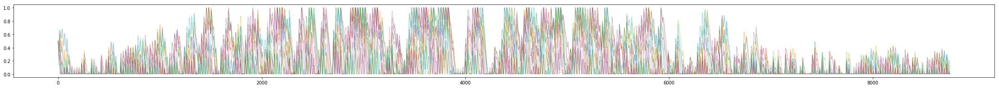

1
0.2
2000
1562218047.081341
LOSS : 0.352
LOSS : 0.439
LOSS : 0.562
LOSS : 0.713
LOSS : 0.850
LOSS : 1.012
LOSS : 1.173


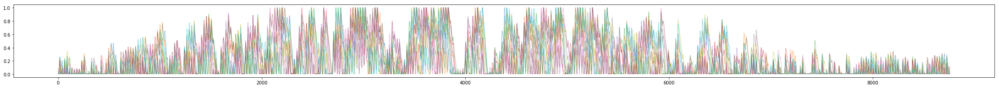

2
0.30000000000000004
2000
1562218175.606261
LOSS : 1.337
LOSS : 1.497
LOSS : 1.728
LOSS : 2.007
LOSS : 2.226
LOSS : 2.486
LOSS : 2.794


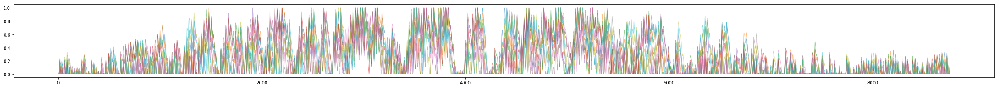

3
0.4
2000
1562218305.3671904
LOSS : 2.982
LOSS : 3.028
LOSS : 3.184
LOSS : 3.429
LOSS : 3.663
LOSS : 3.939
LOSS : 4.338


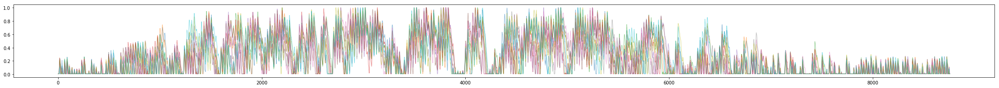

4
0.5
2000
1562218436.2441547
LOSS : 4.453
LOSS : 4.456
LOSS : 4.538
LOSS : 4.645
LOSS : 4.869
LOSS : 5.089
LOSS : 5.435
LOSS : 5.718


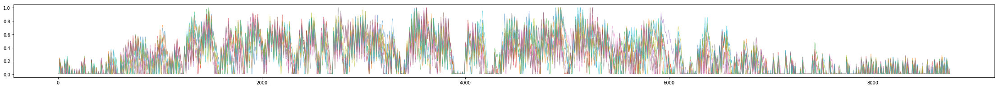

5
0.6
2000
1562218566.053361
LOSS : 5.639
LOSS : 5.604
LOSS : 5.756
LOSS : 5.895
LOSS : 5.912
LOSS : 6.260
LOSS : 6.682


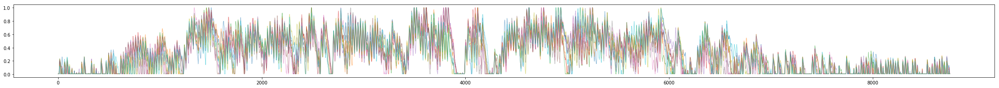

6
0.7000000000000001
2000
1562218692.8224866
LOSS : 6.462
LOSS : 6.221
LOSS : 6.256
LOSS : 6.513
LOSS : 6.434
LOSS : 6.425
LOSS : 6.860


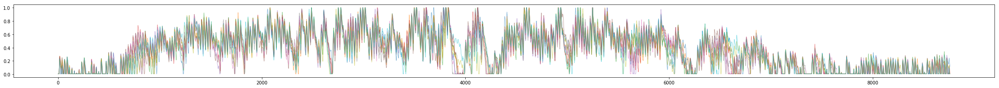

7
0.8
2000
1562218819.5795722
LOSS : 6.752
LOSS : 6.491
LOSS : 6.590
LOSS : 6.436
LOSS : 6.348
LOSS : 6.351
LOSS : 6.497


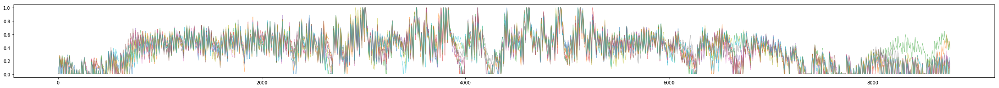

8
0.9
2000
1562218946.8526309
LOSS : 6.585
LOSS : 6.368
LOSS : 6.119
LOSS : 5.875
LOSS : 5.919
LOSS : 5.472
LOSS : 5.455
LOSS : 5.535


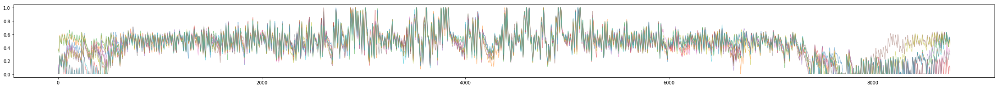

9
0.99
2000
1562219074.297666
LOSS : 5.441
LOSS : 5.379
LOSS : 5.143
LOSS : 4.813
LOSS : 4.480
LOSS : 4.187
LOSS : 4.013


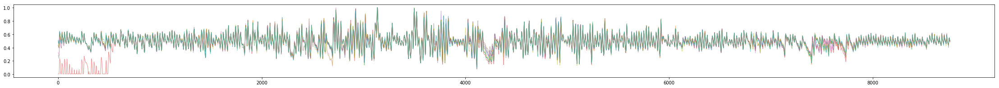

10
0.99
2000
1562219202.5146883
LOSS : 4.005
LOSS : 3.655
LOSS : 3.388
LOSS : 3.114
LOSS : 2.706
LOSS : 2.294
LOSS : 2.009


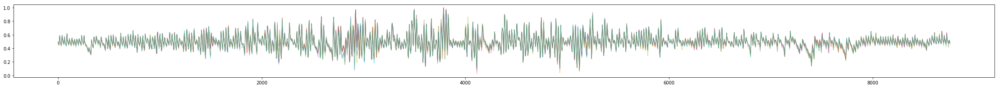

11
0.99
2000
1562219331.2476993
LOSS : 1.988
LOSS : 1.795
LOSS : 1.604
LOSS : 1.446
LOSS : 1.446
LOSS : 1.153
LOSS : 0.935


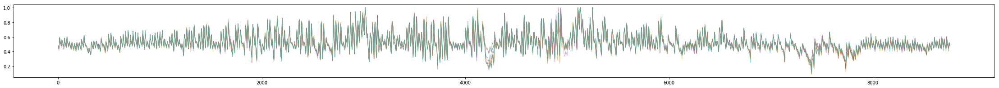

12
0.99
2000
1562219459.4766943
LOSS : 0.939
LOSS : 0.865
LOSS : 0.864
LOSS : 0.898
LOSS : 1.076
LOSS : 1.104
LOSS : 1.026
LOSS : 1.151


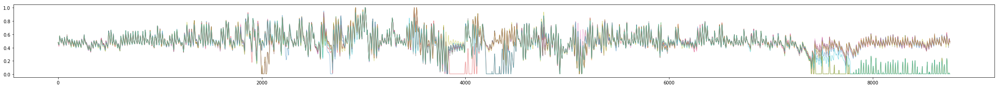

13
0.99
2000
1562219586.585672
LOSS : 1.166
LOSS : 1.167
LOSS : 1.259
LOSS : 1.254
LOSS : 1.227
LOSS : 1.195
LOSS : 1.242


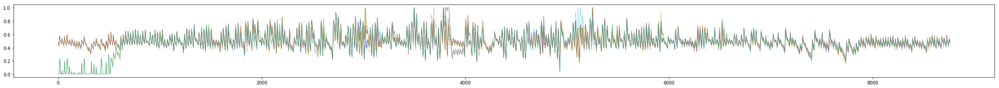

14
0.99
2000
1562219714.3186471
LOSS : 1.293
LOSS : 1.293
LOSS : 1.309
LOSS : 1.313
LOSS : 1.452
LOSS : 1.444
LOSS : 1.521


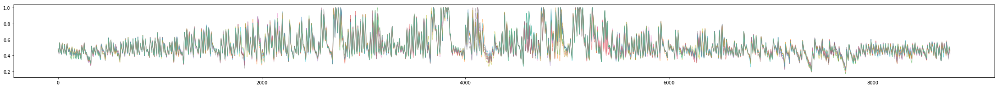

15
0.99
2000
1562219841.5836134
LOSS : 1.491
LOSS : 1.393
LOSS : 1.185
LOSS : 1.123
LOSS : 1.092
LOSS : 0.937
LOSS : 0.852


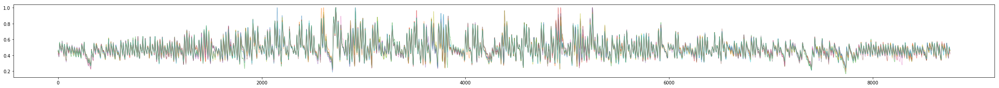

16
0.99
2000
1562219968.7645745
LOSS : 0.805
LOSS : 0.817
LOSS : 0.768
LOSS : 0.742
LOSS : 0.731
LOSS : 0.662
LOSS : 0.664
LOSS : 0.708


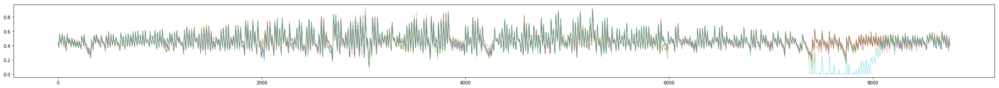

17
0.99
2000
1562220093.2735124
LOSS : 0.689
LOSS : 0.598
LOSS : 0.533
LOSS : 0.460
LOSS : 0.440
LOSS : 0.431
LOSS : 0.431


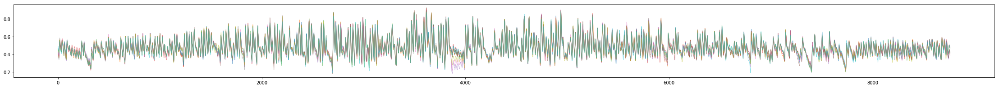

18
0.99
2000
1562220218.2624514
LOSS : 0.435
LOSS : 0.417
LOSS : 0.404
LOSS : 0.413
LOSS : 0.422
LOSS : 0.387
LOSS : 0.391


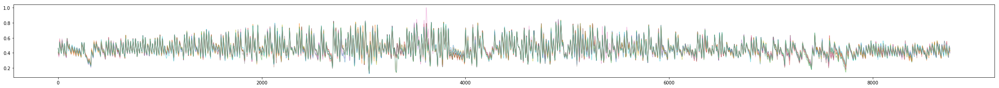

19
0.99
2000
1562220346.6154134
LOSS : 0.409
LOSS : 0.394
LOSS : 0.373
LOSS : 0.380
LOSS : 0.366
LOSS : 0.314
LOSS : 0.364


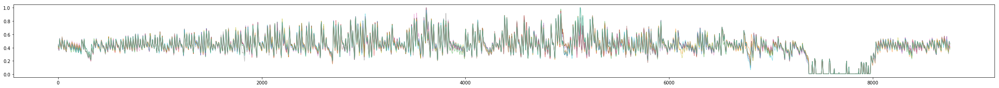

In [25]:
from figplot import figplot

ANNUAL_MEMORY = []
TOTAL_MEMORY = []

yr = 2000
dummy1 = CAPM(LOCATION, yr)
dummy1.eno = ENO(LOCATION, yr)
dummy1.HMAX = dummy1.eno.SMAX
dummy1.reset()
capm_list = [dummy1]*NO_OF_NODES

for iteration in range(20):
    print(iteration)
    e_slope = 0.1
    e_start = 0.1
    sc_EPSILON = np.clip(e_start + e_slope*iteration,0.1,0.99)
    print(sc_EPSILON)
    ANNUAL_MEMORY.clear()

    for cpm in capm_list:
        cpm.eno.day = 0
    print(capm_list[0].year)
    
    stat = os.stat(MODEL_FILENAME)
    print(stat.st_mtime)
    
    for day in range(365):
        
        
        day_list = [day]*NO_OF_NODES
        sc_EPSILON_list = [sc_EPSILON]*NO_OF_NODES
        param_list = [MODEL_FILENAME]*NO_OF_NODES
        arglist = [arg for arg in zip(range(NO_OF_NODES), day_list, sc_EPSILON_list, param_list, capm_list)]
        result = pool.starmap(T_ENO, arglist)

        node_experience  = np.array([item[0] for item in result])
        capm_list = [item[1] for item in result]

        ANNUAL_MEMORY.append(node_experience)
        TOTAL_MEMORY.append(node_experience)
        all_exp = np.array([item for each_node_exp in node_experience 
                                    for episode_exp in each_node_exp 
                                        for item in episode_exp]).reshape(-1,10)

        dqn.memory = np.insert(dqn.memory, 0, all_exp , 0)
        dqn.memory = dqn.memory[:MEMORY_CAPACITY,:]
        dqn.memory_counter += all_exp.shape[0]


        if dqn.memory_counter > 24*7:#MEMORY_CAPACITY:
            for nn_iter in range(NN_ITERATIONS):
                dqn.learn()
            # SAVE MODEL
            torch.save(dqn.eval_net.state_dict(), MODEL_FILENAME)

    AN_NUAL_MEMORY = np.array(ANNUAL_MEMORY)
    MEM = np.einsum('dnes->ndes',AN_NUAL_MEMORY)
    #single file all data
    STATES = MEM[:,:,:,0:N_STATES].reshape(-1,4)
    ACTIONS = MEM[:,:,:,N_STATES:N_STATES+1].reshape(-1,1)
    REWARDS = MEM[:,:,:,N_STATES+1:N_STATES+2].reshape(-1,1)
    #Destandardize state values from memory
    DSTD_STATES = batch_destdize(STATES)
    #NODE_MEMS contains list of (s,a,r) for all hours of all days for each node
    NODE_MEMS = np.column_stack((DSTD_STATES,ACTIONS,REWARDS))
    NODE_MEMS = NODE_MEMS.reshape(NO_OF_NODES,-1,6)

    plt.figure(figsize=(39,3))
    for i in range(NO_OF_NODES):
        plt.plot(NODE_MEMS[i,:,0], alpha=0.5, linewidth=1.0)
    plt.show()


pool.close()
pool.join()
    
    

In [26]:
# TOTAL_MEMORY = np.array(TOTAL_MEMORY)

# MEM = np.einsum('dnes->ndes',TOTAL_MEMORY)

# #single file all data
# STATES = MEM[:,:,:,0:N_STATES].reshape(-1,4)
# ACTIONS = MEM[:,:,:,N_STATES:N_STATES+1].reshape(-1,1)
# REWARDS = MEM[:,:,:,N_STATES+1:N_STATES+2].reshape(-1,1)

In [27]:
# #Destandardize state values from memory
# DSTD_STATES = batch_destdize(STATES)

In [28]:
# #NODE_MEMS contains list of (s,a,r) for all hours of all days for each node
# NODE_MEMS = np.column_stack((DSTD_STATES,ACTIONS,REWARDS))
# NODE_MEMS = NODE_MEMS.reshape(NO_OF_NODES,-1,6)
# # np.save('DENO',NODE_MEMS)


In [29]:
# plt.figure(figsize=(24,3))
# plt.plot(node_0[:,0],'r')
# # plt.plot(z[:,1])
# plt.plot(node_0[:,2],'c',alpha=0.4)
# # plt.plot(node_0[:,3],'b')
# plt.plot(node_0[:,4]/9,'b')
# # plt.plot(node_0[:,5],'k--')
# plt.minorticks_on()

# plt.grid(which='both',axis='x')

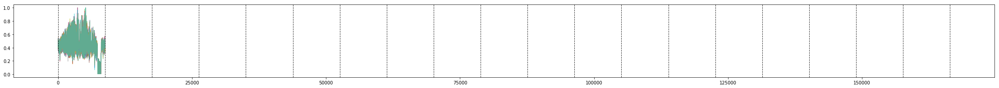

In [30]:
plt.figure(figsize=(39,3))
for i in range(NO_OF_NODES):
    plt.plot(NODE_MEMS[i,:,0], alpha=0.5, linewidth=1.0)
for i in range(iteration+1):
    plt.axvline(x=i*24*365,color='k',linewidth=1.0,linestyle='--',alpha=0.8)



In [31]:
batt = NODE_MEMS[:,:,0]

In [32]:
downtime_occur = (batt < 0.006).astype(int)
overflow_occur = (batt == 1).astype(int)

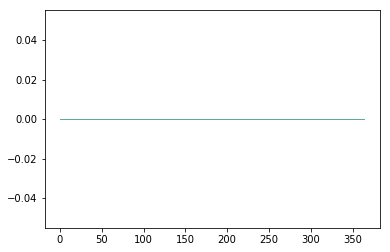

In [33]:
#DOWNTIME PER NODE WITH TIME
for i in range(NO_OF_NODES):
    plt.plot(downtime_occur[i,0:365].cumsum(), alpha=0.5, linewidth=1.0)

# for i in range(iteration+1):
#     plt.axvline(x=i*24*365,color='k',linewidth=1.0,linestyle='--',alpha=0.1)

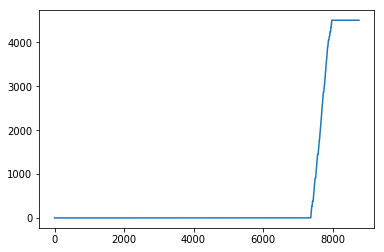

In [34]:
# OVERALL DOWNTIME OF SYSTEM

total_downtime = downtime_occur.sum(axis=0)
plt.plot(total_downtime.cumsum())

# for i in range(iteration+1):
#     plt.axvline(x=i*24*365,color='k',linewidth=1.0,linestyle='--',alpha=0.1)

<BarContainer object of 10 artists>

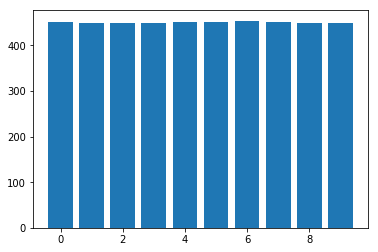

In [35]:
# TOTAL DOWNTIME PER NODE

total_downtime = downtime_occur.sum(axis = 1)
plt.bar(range(NO_OF_NODES),height = total_downtime)

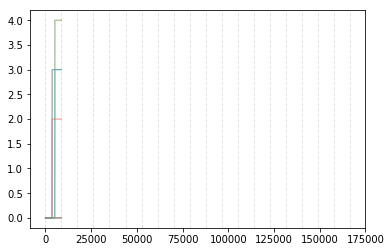

In [36]:
#OVERFLOW PER NODE WITH TIME

for i in range(NO_OF_NODES):
    plt.plot(overflow_occur[i,:].cumsum(), alpha=0.5, linewidth=1.0)
    
for i in range(iteration+1):
    plt.axvline(x=i*24*365,color='k',linewidth=1.0,linestyle='--',alpha=0.1)

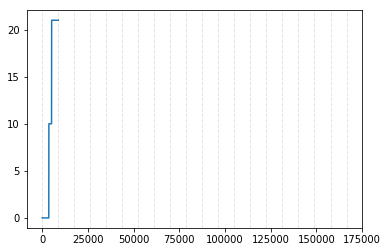

In [37]:
# OVERALL OVERFLOW OF SYSTEM

total_overflow = overflow_occur.sum(axis=0)
plt.plot(total_overflow.cumsum())

for i in range(iteration+1):
    plt.axvline(x=i*24*365,color='k',linewidth=1.0,linestyle='--',alpha=0.1)

<BarContainer object of 10 artists>

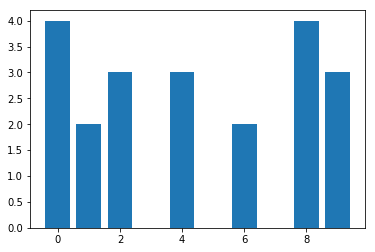

In [38]:
# TOTAL OVERFLOW  PER NODE

total_overflow = overflow_occur.sum(axis = 1)
plt.bar(range(NO_OF_NODES),height = total_overflow)

In [39]:
S_FILENAME = MODEL_FILENAME
print("Loading MODEL from FILE: ", S_FILENAME)
dqn = DQN()
dqn.eval_net.load_state_dict(torch.load(S_FILENAME))
dqn.eval_net.eval()
print("DEVICE: ", dqn.device)

Loading MODEL from FILE:  ./models/DENOSTI6WR1Z__05_25_16__161.pt
DEVICE:  cpu


***MEASURING PERFORMANCE OF THE MODEL***


************************************
Day Violations           =     80
Battery Limit Violations =   1710
Battery FULL Violations  =     18
Battery EMPTY Violations =   1692


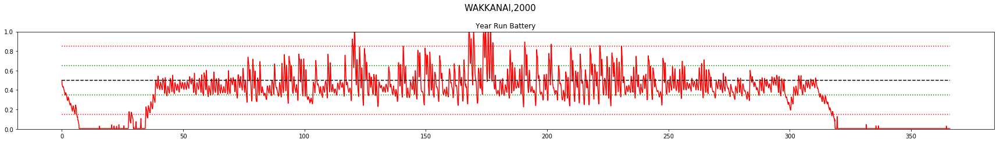



************************************
Day Violations           =    104
Battery Limit Violations =   2218
Battery FULL Violations  =     25
Battery EMPTY Violations =   2193


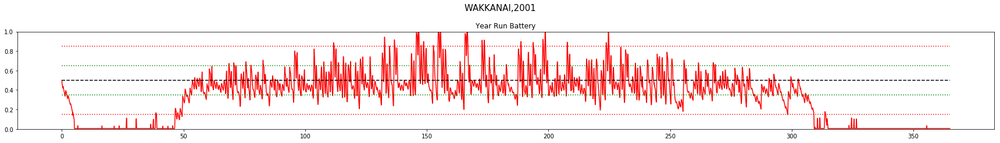



************************************
Day Violations           =     88
Battery Limit Violations =   1817
Battery FULL Violations  =     25
Battery EMPTY Violations =   1792


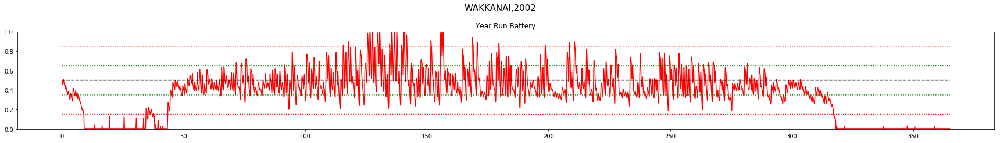



************************************
Day Violations           =     80
Battery Limit Violations =   1746
Battery FULL Violations  =     10
Battery EMPTY Violations =   1736


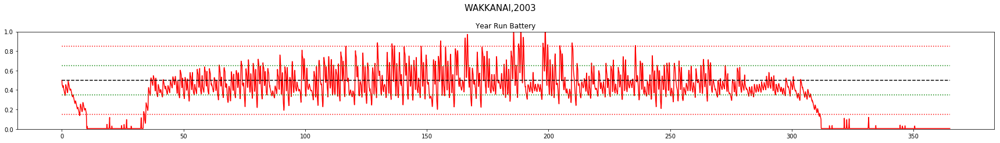



************************************
Day Violations           =     85
Battery Limit Violations =   1774
Battery FULL Violations  =     19
Battery EMPTY Violations =   1755


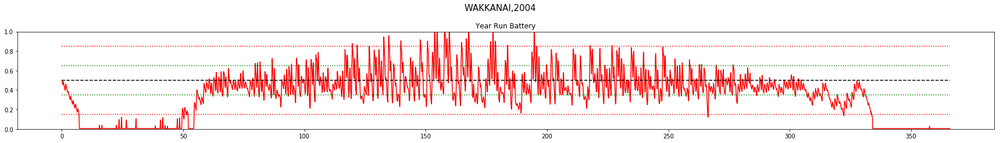



************************************
Day Violations           =    103
Battery Limit Violations =   2169
Battery FULL Violations  =     19
Battery EMPTY Violations =   2150


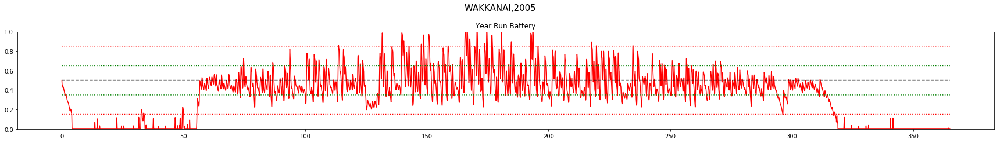



************************************
Day Violations           =     70
Battery Limit Violations =   1517
Battery FULL Violations  =     18
Battery EMPTY Violations =   1499


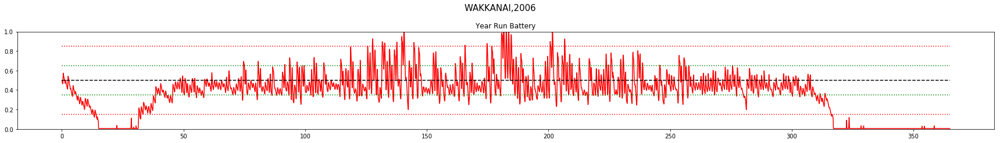



************************************
Day Violations           =     96
Battery Limit Violations =   1846
Battery FULL Violations  =     32
Battery EMPTY Violations =   1814


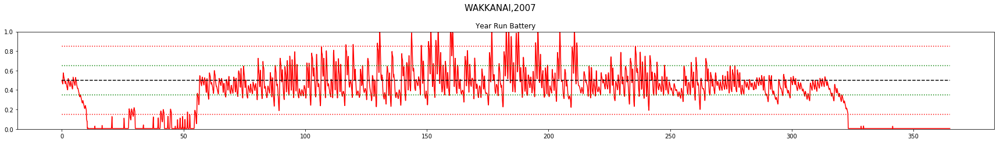



************************************
Day Violations           =     79
Battery Limit Violations =   1666
Battery FULL Violations  =     25
Battery EMPTY Violations =   1641


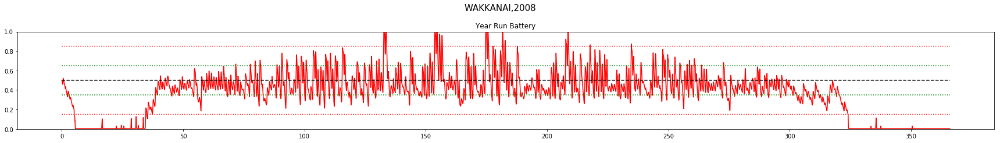



************************************
Day Violations           =    101
Battery Limit Violations =   2215
Battery FULL Violations  =      2
Battery EMPTY Violations =   2213


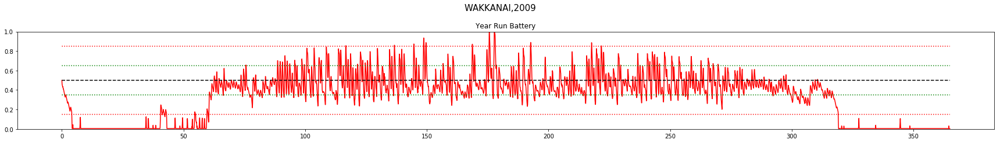



************************************
Day Violations           =     95
Battery Limit Violations =   2047
Battery FULL Violations  =     20
Battery EMPTY Violations =   2027


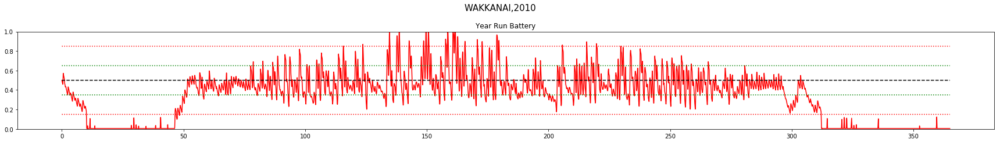



************************************
Day Violations           =     85
Battery Limit Violations =   1788
Battery FULL Violations  =     18
Battery EMPTY Violations =   1770


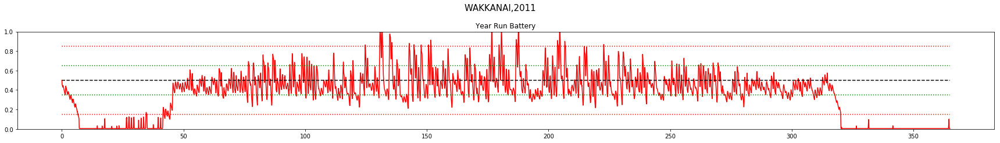



************************************
Day Violations           =    100
Battery Limit Violations =   2223
Battery FULL Violations  =     12
Battery EMPTY Violations =   2211


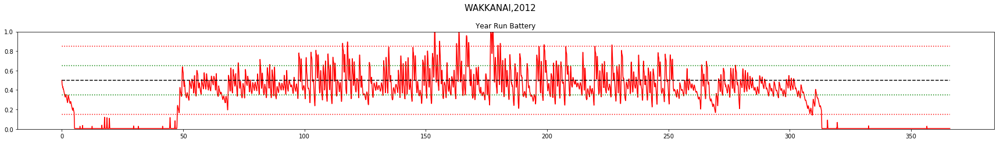



************************************
Day Violations           =     88
Battery Limit Violations =   1871
Battery FULL Violations  =     22
Battery EMPTY Violations =   1849


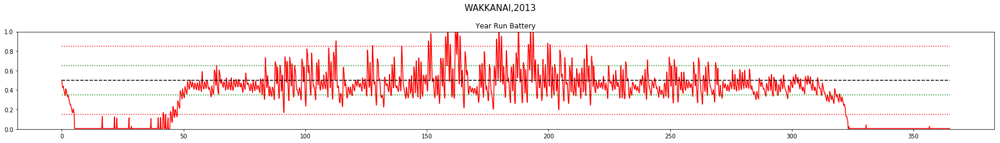



************************************
Day Violations           =    108
Battery Limit Violations =   2203
Battery FULL Violations  =     16
Battery EMPTY Violations =   2187


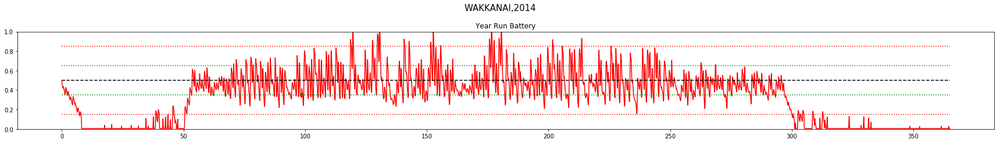



************************************
Day Violations           =     84
Battery Limit Violations =   1714
Battery FULL Violations  =     18
Battery EMPTY Violations =   1696


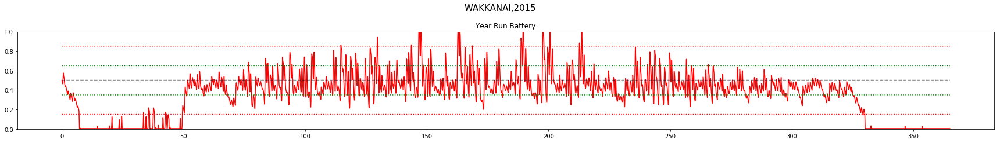



************************************
Day Violations           =    122
Battery Limit Violations =   2493
Battery FULL Violations  =     31
Battery EMPTY Violations =   2462


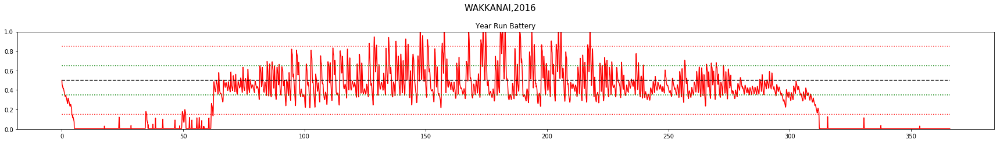



************************************
Day Violations           =     77
Battery Limit Violations =   1659
Battery FULL Violations  =     16
Battery EMPTY Violations =   1643


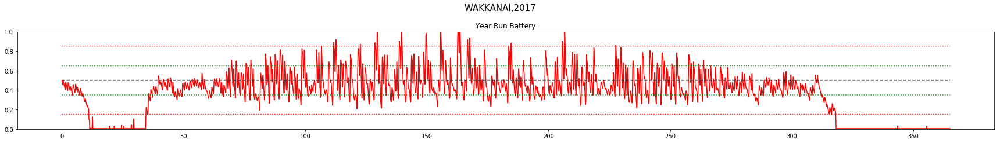



************************************
Day Violations           =    104
Battery Limit Violations =   2205
Battery FULL Violations  =     19
Battery EMPTY Violations =   2186


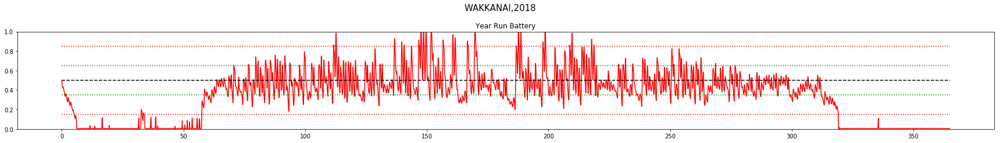



WAKKANAI
YEAR	AVG_RWD		VIOLATIONS	EMPTY	FULL
			DAY	BATT
2000	 0.55		80	 1710	1692	18
2001	 0.43		104	 2218	2193	25
2002	 0.53		88	 1817	1792	25
2003	 0.55		80	 1746	1736	10
2004	 0.53		85	 1774	1755	19
2005	 0.43		103	 2169	2150	19
2006	 0.59		70	 1517	1499	18
2007	 0.51		96	 1846	1814	32
2008	 0.57		79	 1666	1641	25
2009	 0.45		101	 2215	2213	2
2010	 0.46		95	 2047	2027	20
2011	 0.54		85	 1788	1770	18
2012	 0.46		100	 2223	2211	12
2013	 0.52		88	 1871	1849	22
2014	 0.4		108	 2203	2187	16
2015	 0.55		84	 1714	1696	18
2016	 0.37		122	 2493	2462	31
2017	 0.59		77	 1659	1643	16
2018	 0.43		104	 2205	2186	19

TOTAL Day  Violations:   1749.0
TOTAL Batt  Violations:  36881.0
TOTAL EMPTY Violations:  36516.0
TOTAL FULL  Violations:  365.0
************************************


************************************
Day Violations           =     78
Battery Limit Violations =   1539
Battery FULL Violations  =     15
Battery EMPTY Violations =   1524


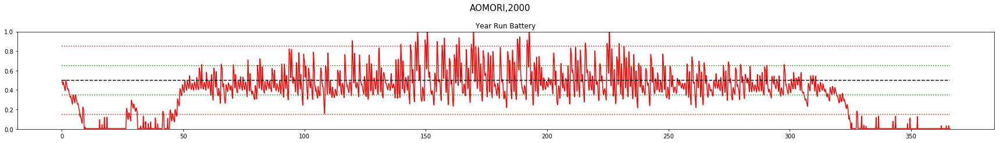



************************************
Day Violations           =     36
Battery Limit Violations =    619
Battery FULL Violations  =     36
Battery EMPTY Violations =    583


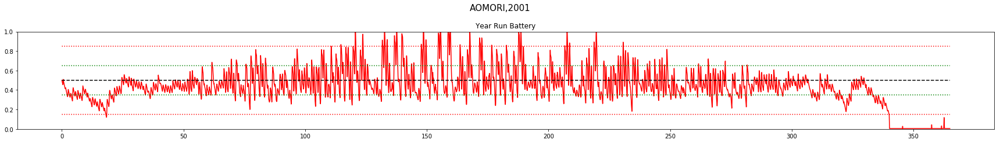



************************************
Day Violations           =     68
Battery Limit Violations =   1215
Battery FULL Violations  =     30
Battery EMPTY Violations =   1185


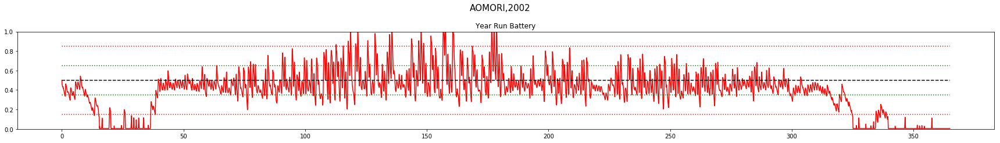



************************************
Day Violations           =     36
Battery Limit Violations =    676
Battery FULL Violations  =     24
Battery EMPTY Violations =    652


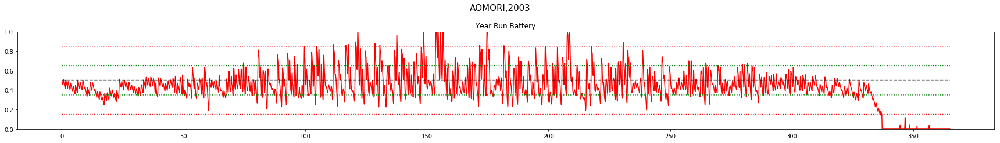



************************************
Day Violations           =     33
Battery Limit Violations =    683
Battery FULL Violations  =      9
Battery EMPTY Violations =    674


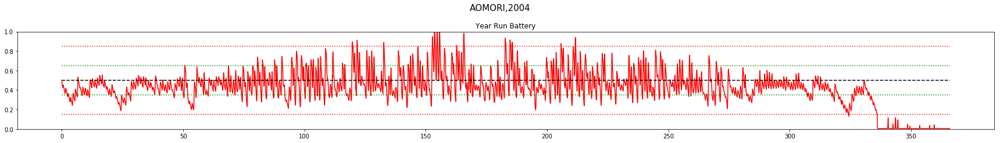



************************************
Day Violations           =     78
Battery Limit Violations =   1509
Battery FULL Violations  =     13
Battery EMPTY Violations =   1496


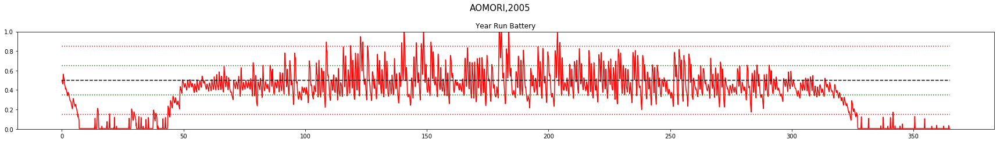



************************************
Day Violations           =     80
Battery Limit Violations =   1655
Battery FULL Violations  =     10
Battery EMPTY Violations =   1645


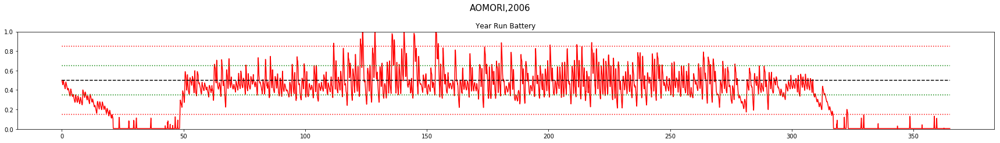



************************************
Day Violations           =     70
Battery Limit Violations =   1256
Battery FULL Violations  =     43
Battery EMPTY Violations =   1213


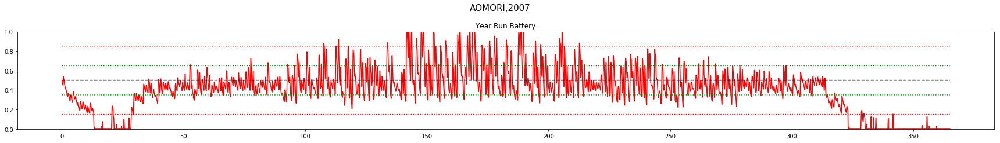



************************************
Day Violations           =     44
Battery Limit Violations =    834
Battery FULL Violations  =     17
Battery EMPTY Violations =    817


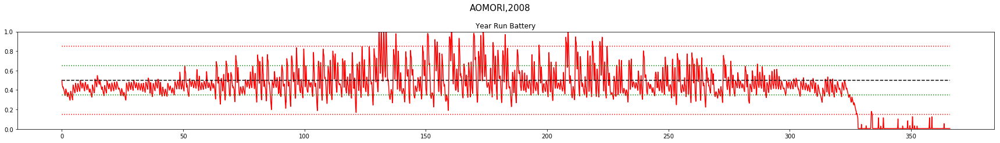



************************************
Day Violations           =     22
Battery Limit Violations =    470
Battery FULL Violations  =      1
Battery EMPTY Violations =    469


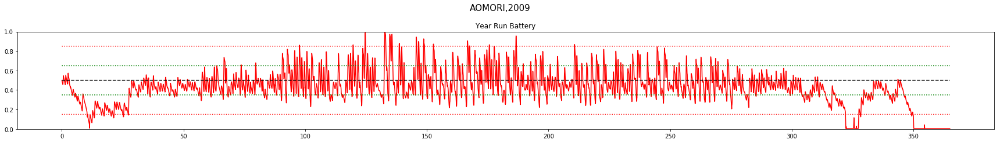



************************************
Day Violations           =     46
Battery Limit Violations =    862
Battery FULL Violations  =     21
Battery EMPTY Violations =    841


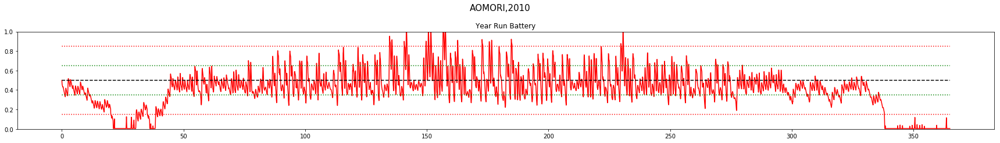



************************************
Day Violations           =     45
Battery Limit Violations =    949
Battery FULL Violations  =     10
Battery EMPTY Violations =    939


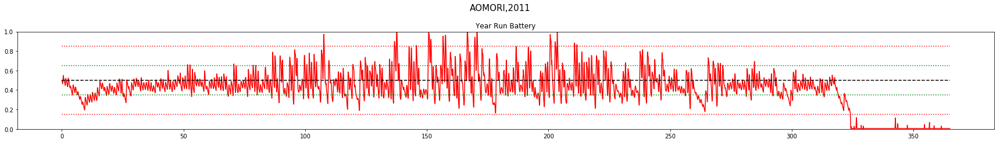



************************************
Day Violations           =     53
Battery Limit Violations =    963
Battery FULL Violations  =     41
Battery EMPTY Violations =    922


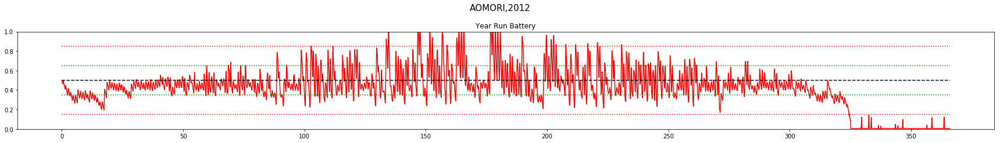



************************************
Day Violations           =     48
Battery Limit Violations =    880
Battery FULL Violations  =     17
Battery EMPTY Violations =    863


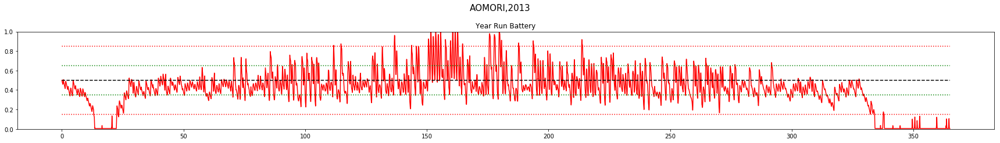



************************************
Day Violations           =     47
Battery Limit Violations =    958
Battery FULL Violations  =     16
Battery EMPTY Violations =    942


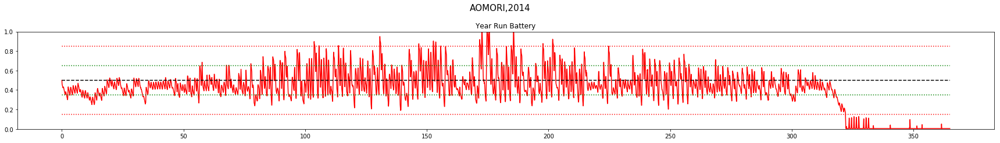



************************************
Day Violations           =     71
Battery Limit Violations =   1309
Battery FULL Violations  =     24
Battery EMPTY Violations =   1285


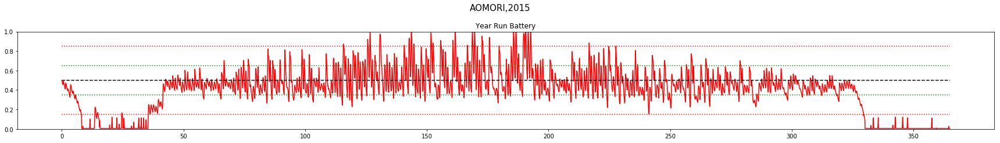



************************************
Day Violations           =     72
Battery Limit Violations =   1398
Battery FULL Violations  =     25
Battery EMPTY Violations =   1373


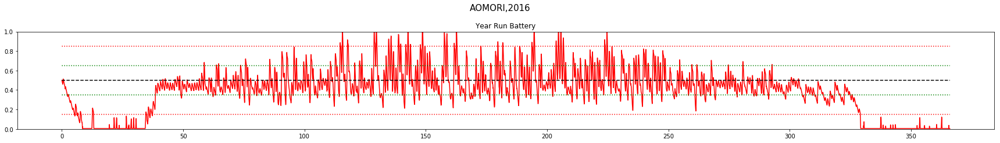



************************************
Day Violations           =     80
Battery Limit Violations =   1528
Battery FULL Violations  =     27
Battery EMPTY Violations =   1501


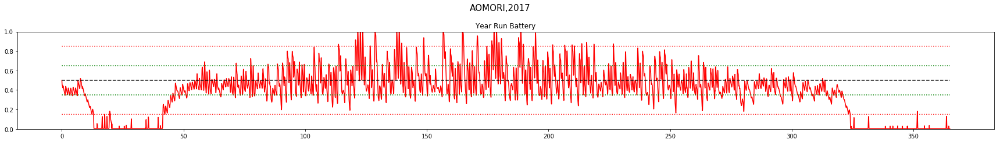



************************************
Day Violations           =     31
Battery Limit Violations =    531
Battery FULL Violations  =     25
Battery EMPTY Violations =    506


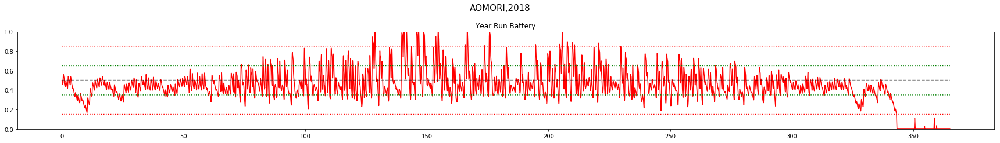



AOMORI
YEAR	AVG_RWD		VIOLATIONS	EMPTY	FULL
			DAY	BATT
2000	 0.56		78	 1539	1524	15
2001	 0.8		36	 619	583	36
2002	 0.64		68	 1215	1185	30
2003	 0.82		36	 676	652	24
2004	 0.8		33	 683	674	9
2005	 0.56		78	 1509	1496	13
2006	 0.55		80	 1655	1645	10
2007	 0.63		70	 1256	1213	43
2008	 0.77		44	 834	817	17
2009	 0.81		22	 470	469	1
2010	 0.72		46	 862	841	21
2011	 0.74		45	 949	939	10
2012	 0.74		53	 963	922	41
2013	 0.75		48	 880	863	17
2014	 0.75		47	 958	942	16
2015	 0.62		71	 1309	1285	24
2016	 0.6		72	 1398	1373	25
2017	 0.59		80	 1528	1501	27
2018	 0.84		31	 531	506	25

TOTAL Day  Violations:   1038.0
TOTAL Batt  Violations:  19834.0
TOTAL EMPTY Violations:  19430.0
TOTAL FULL  Violations:  404.0
************************************


************************************
Day Violations           =      1
Battery Limit Violations =      1
Battery FULL Violations  =      1
Battery EMPTY Violations =      0


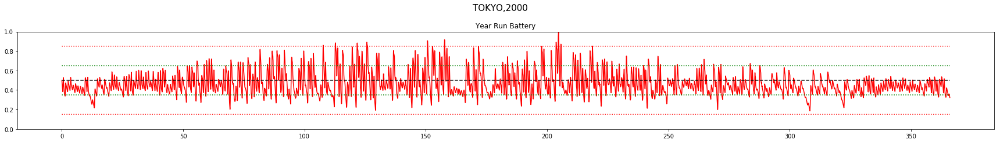



************************************
Day Violations           =      2
Battery Limit Violations =      6
Battery FULL Violations  =      6
Battery EMPTY Violations =      0


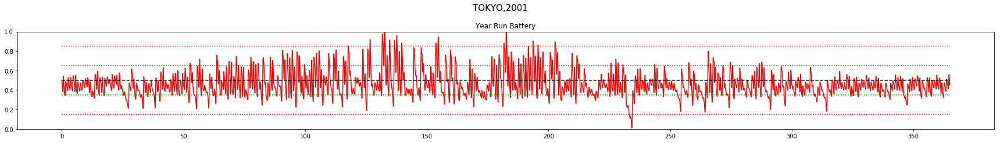



************************************
Day Violations           =      4
Battery Limit Violations =      7
Battery FULL Violations  =      7
Battery EMPTY Violations =      0


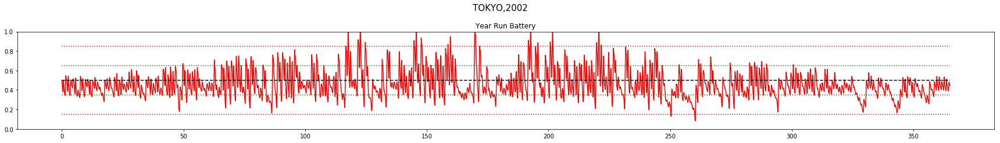



************************************
Day Violations           =      2
Battery Limit Violations =      6
Battery FULL Violations  =      2
Battery EMPTY Violations =      4


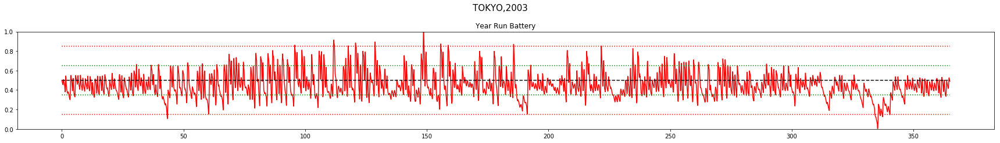



************************************
Day Violations           =      7
Battery Limit Violations =    107
Battery FULL Violations  =      5
Battery EMPTY Violations =    102


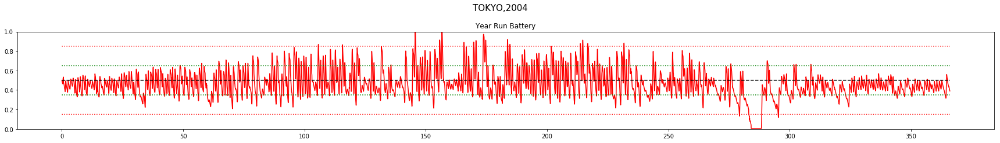



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


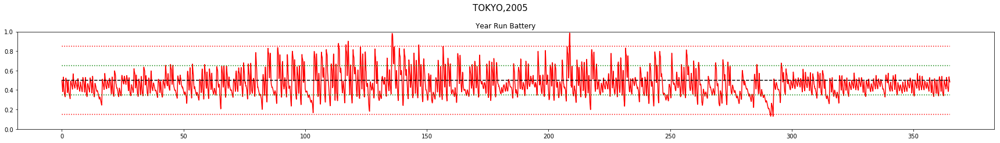



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


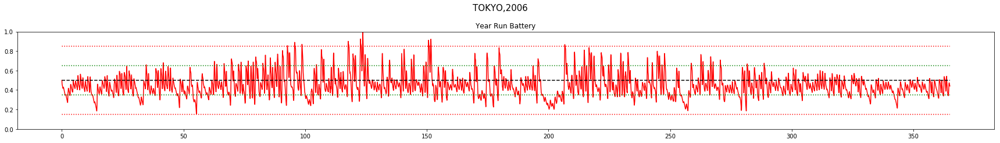



************************************
Day Violations           =      3
Battery Limit Violations =     10
Battery FULL Violations  =     10
Battery EMPTY Violations =      0


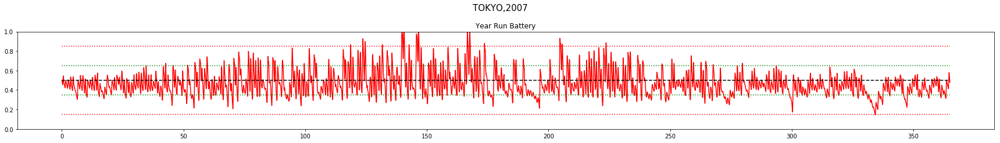



************************************
Day Violations           =      3
Battery Limit Violations =      8
Battery FULL Violations  =      8
Battery EMPTY Violations =      0


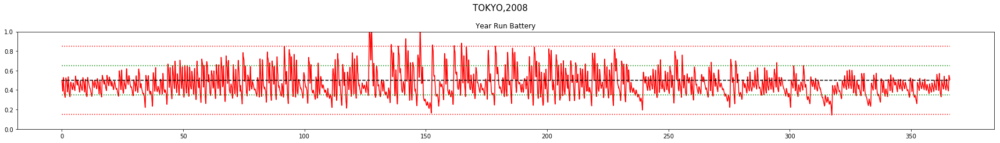



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


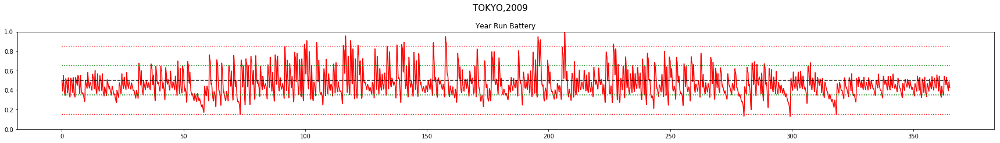



************************************
Day Violations           =      2
Battery Limit Violations =      2
Battery FULL Violations  =      2
Battery EMPTY Violations =      0


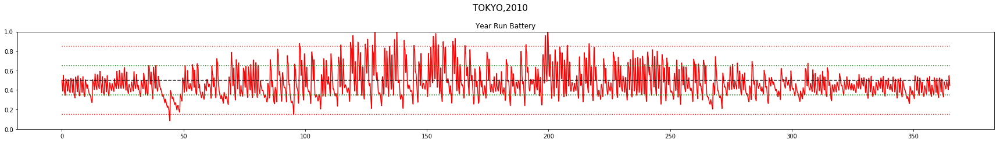



************************************
Day Violations           =      4
Battery Limit Violations =      8
Battery FULL Violations  =      8
Battery EMPTY Violations =      0


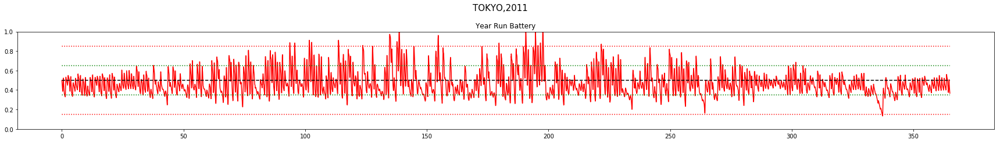



************************************
Day Violations           =      3
Battery Limit Violations =      9
Battery FULL Violations  =      9
Battery EMPTY Violations =      0


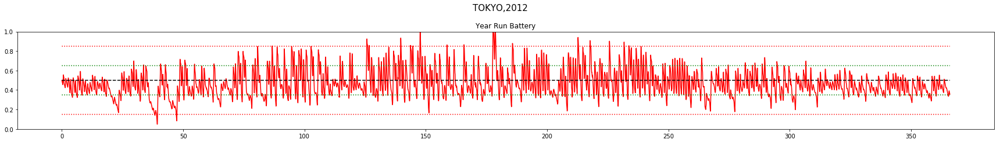



************************************
Day Violations           =      5
Battery Limit Violations =      8
Battery FULL Violations  =      8
Battery EMPTY Violations =      0


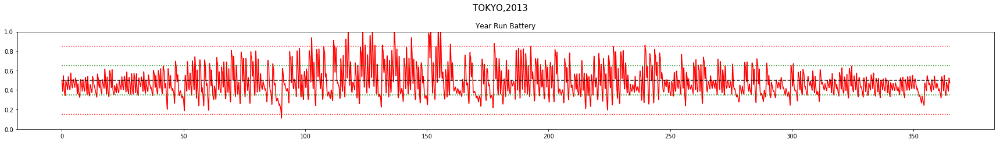



************************************
Day Violations           =      5
Battery Limit Violations =     12
Battery FULL Violations  =     12
Battery EMPTY Violations =      0


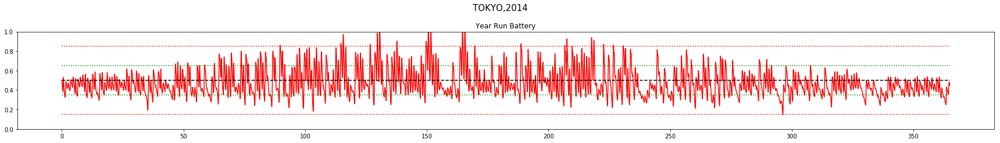



************************************
Day Violations           =      6
Battery Limit Violations =     15
Battery FULL Violations  =     15
Battery EMPTY Violations =      0


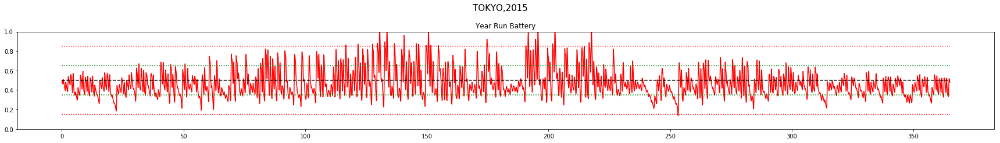



************************************
Day Violations           =      8
Battery Limit Violations =     27
Battery FULL Violations  =     27
Battery EMPTY Violations =      0


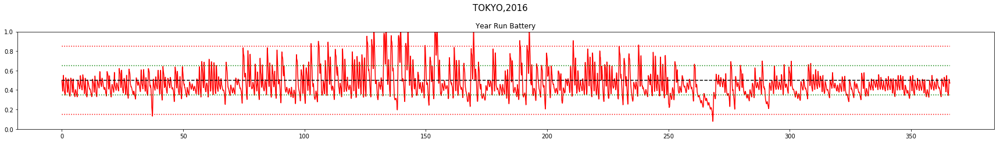



************************************
Day Violations           =      3
Battery Limit Violations =      8
Battery FULL Violations  =      8
Battery EMPTY Violations =      0


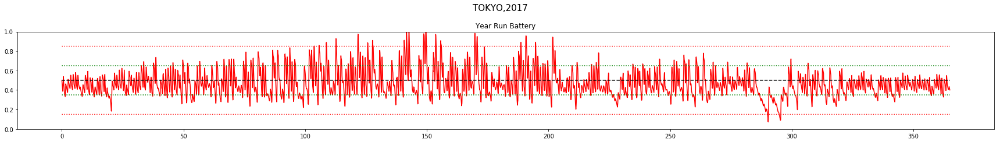



************************************
Day Violations           =      8
Battery Limit Violations =     23
Battery FULL Violations  =     23
Battery EMPTY Violations =      0


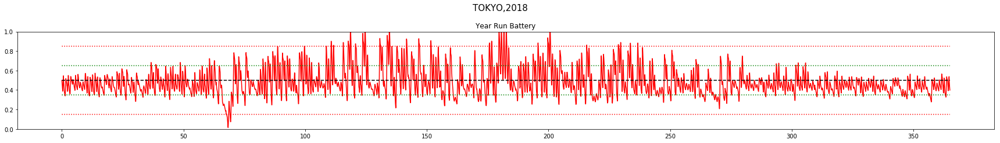



TOKYO
YEAR	AVG_RWD		VIOLATIONS	EMPTY	FULL
			DAY	BATT
2000	 0.99		1	 1	0	1
2001	 0.98		2	 6	0	6
2002	 0.96		4	 7	0	7
2003	 0.96		2	 6	4	2
2004	 0.95		7	 107	102	5
2005	 0.98		0	 0	0	0
2006	 0.97		0	 0	0	0
2007	 0.97		3	 10	0	10
2008	 0.98		3	 8	0	8
2009	 0.97		0	 0	0	0
2010	 0.97		2	 2	0	2
2011	 0.98		4	 8	0	8
2012	 0.96		3	 9	0	9
2013	 0.98		5	 8	0	8
2014	 0.98		5	 12	0	12
2015	 0.97		6	 15	0	15
2016	 0.96		8	 27	0	27
2017	 0.96		3	 8	0	8
2018	 0.96		8	 23	0	23

TOTAL Day  Violations:   66.0
TOTAL Batt  Violations:  257.0
TOTAL EMPTY Violations:  106.0
TOTAL FULL  Violations:  151.0
************************************


************************************
Day Violations           =      5
Battery Limit Violations =     13
Battery FULL Violations  =     13
Battery EMPTY Violations =      0


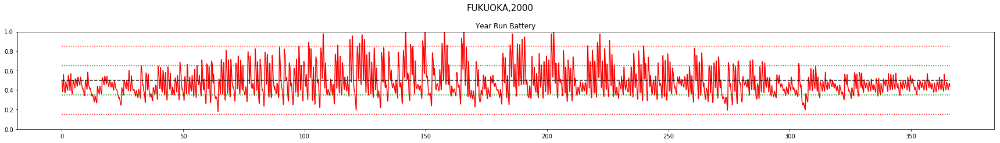



************************************
Day Violations           =      4
Battery Limit Violations =     10
Battery FULL Violations  =     10
Battery EMPTY Violations =      0


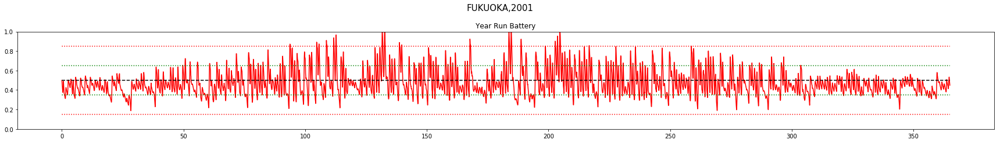



************************************
Day Violations           =      7
Battery Limit Violations =     20
Battery FULL Violations  =     20
Battery EMPTY Violations =      0


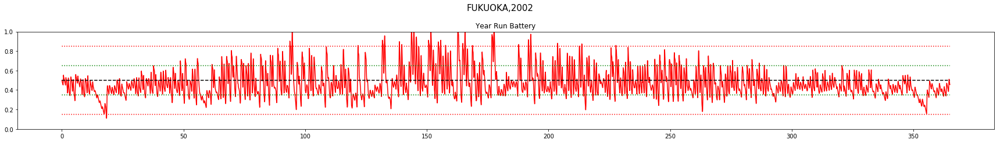



************************************
Day Violations           =      4
Battery Limit Violations =     14
Battery FULL Violations  =     14
Battery EMPTY Violations =      0


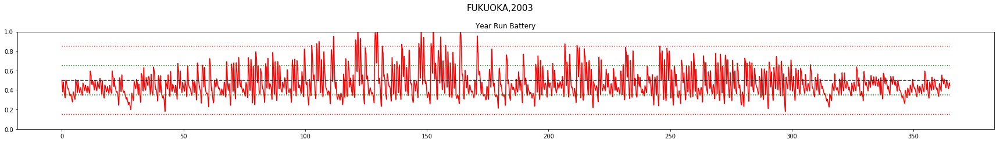



************************************
Day Violations           =      7
Battery Limit Violations =     23
Battery FULL Violations  =     23
Battery EMPTY Violations =      0


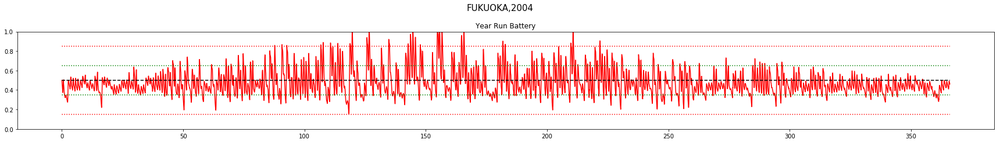



************************************
Day Violations           =      3
Battery Limit Violations =      9
Battery FULL Violations  =      9
Battery EMPTY Violations =      0


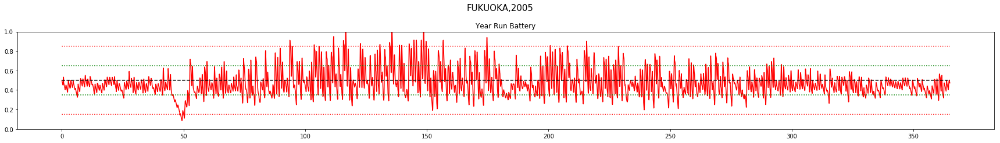



************************************
Day Violations           =      3
Battery Limit Violations =     30
Battery FULL Violations  =      4
Battery EMPTY Violations =     26


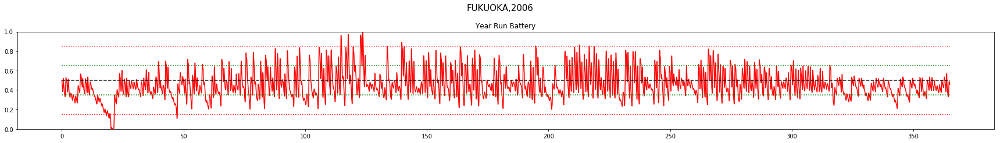



************************************
Day Violations           =      3
Battery Limit Violations =      9
Battery FULL Violations  =      9
Battery EMPTY Violations =      0


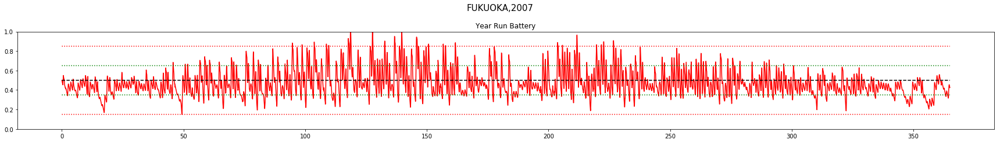



************************************
Day Violations           =      3
Battery Limit Violations =      8
Battery FULL Violations  =      8
Battery EMPTY Violations =      0


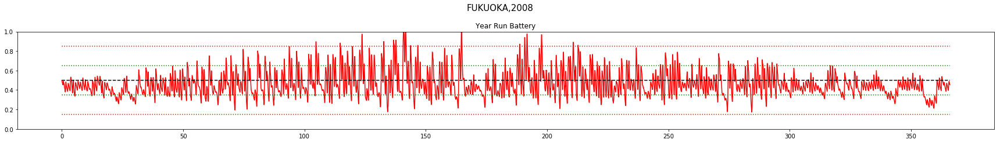



************************************
Day Violations           =     10
Battery Limit Violations =    119
Battery FULL Violations  =      9
Battery EMPTY Violations =    110


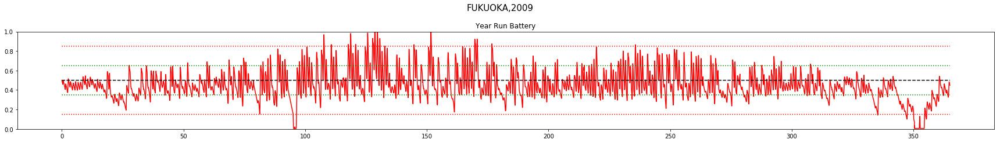



************************************
Day Violations           =      5
Battery Limit Violations =     14
Battery FULL Violations  =     14
Battery EMPTY Violations =      0


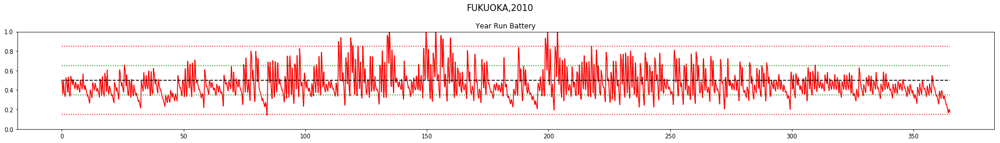



************************************
Day Violations           =      4
Battery Limit Violations =     68
Battery FULL Violations  =      0
Battery EMPTY Violations =     68


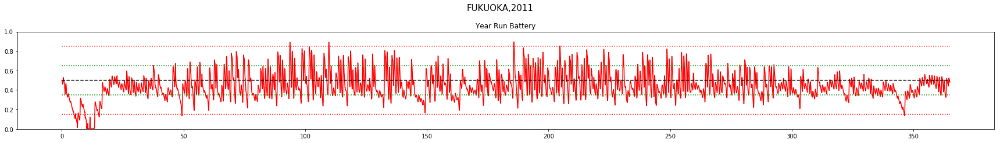



************************************
Day Violations           =      1
Battery Limit Violations =      3
Battery FULL Violations  =      3
Battery EMPTY Violations =      0


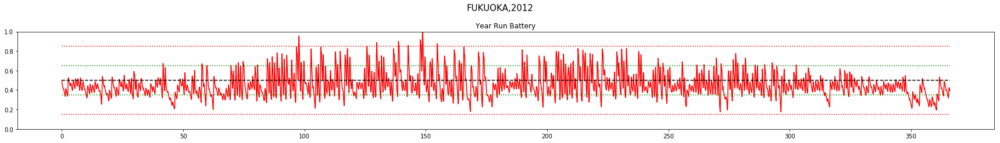



************************************
Day Violations           =      4
Battery Limit Violations =     10
Battery FULL Violations  =     10
Battery EMPTY Violations =      0


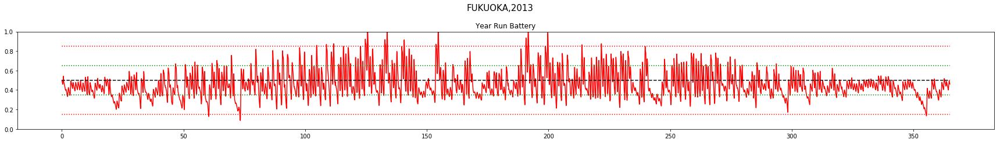



************************************
Day Violations           =      0
Battery Limit Violations =      0
Battery FULL Violations  =      0
Battery EMPTY Violations =      0


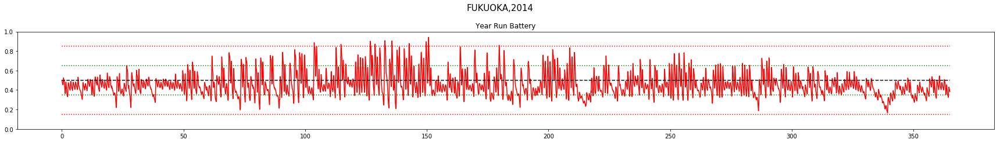



************************************
Day Violations           =      6
Battery Limit Violations =     18
Battery FULL Violations  =     18
Battery EMPTY Violations =      0


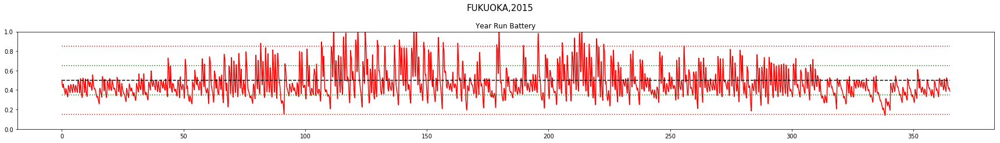



************************************
Day Violations           =     18
Battery Limit Violations =    203
Battery FULL Violations  =     29
Battery EMPTY Violations =    174


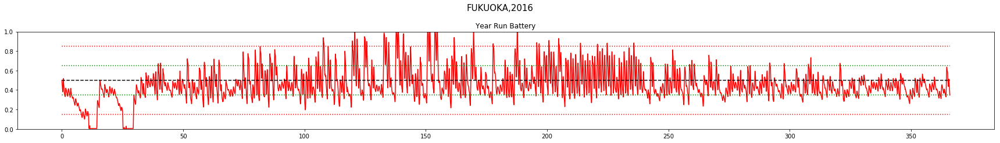



************************************
Day Violations           =     10
Battery Limit Violations =     31
Battery FULL Violations  =     31
Battery EMPTY Violations =      0


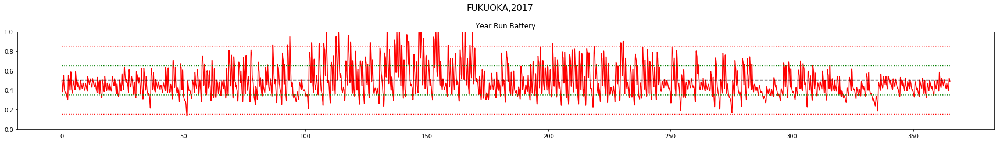



************************************
Day Violations           =     15
Battery Limit Violations =     45
Battery FULL Violations  =     45
Battery EMPTY Violations =      0


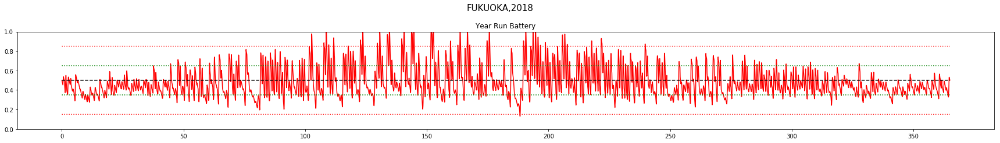



FUKUOKA
YEAR	AVG_RWD		VIOLATIONS	EMPTY	FULL
			DAY	BATT
2000	 0.97		5	 13	0	13
2001	 0.98		4	 10	0	10
2002	 0.96		7	 20	0	20
2003	 0.98		4	 14	0	14
2004	 0.98		7	 23	0	23
2005	 0.98		3	 9	0	9
2006	 0.96		3	 30	26	4
2007	 0.97		3	 9	0	9
2008	 0.98		3	 8	0	8
2009	 0.92		10	 119	110	9
2010	 0.97		5	 14	0	14
2011	 0.94		4	 68	68	0
2012	 0.98		1	 3	0	3
2013	 0.96		4	 10	0	10
2014	 0.99		0	 0	0	0
2015	 0.97		6	 18	0	18
2016	 0.91		18	 203	174	29
2017	 0.96		10	 31	0	31
2018	 0.95		15	 45	0	45

TOTAL Day  Violations:   112.0
TOTAL Batt  Violations:  647.0
TOTAL EMPTY Violations:  378.0
TOTAL FULL  Violations:  269.0
************************************


************************************
Day Violations           =      9
Battery Limit Violations =     26
Battery FULL Violations  =     26
Battery EMPTY Violations =      0


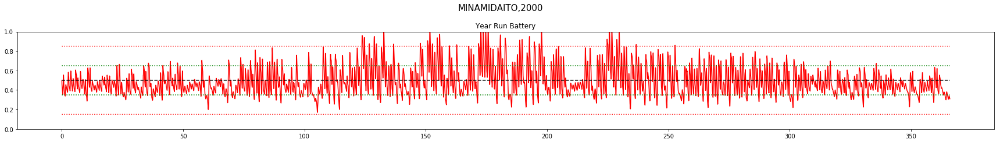



************************************
Day Violations           =     12
Battery Limit Violations =     35
Battery FULL Violations  =     35
Battery EMPTY Violations =      0


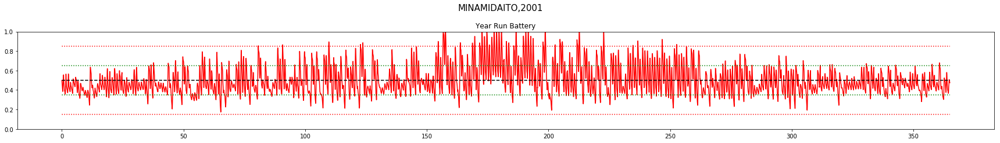



************************************
Day Violations           =      8
Battery Limit Violations =     22
Battery FULL Violations  =     22
Battery EMPTY Violations =      0


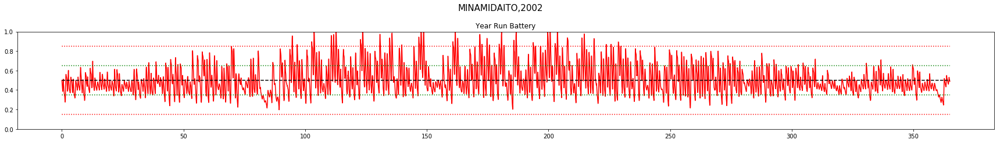



************************************
Day Violations           =     24
Battery Limit Violations =     75
Battery FULL Violations  =     75
Battery EMPTY Violations =      0


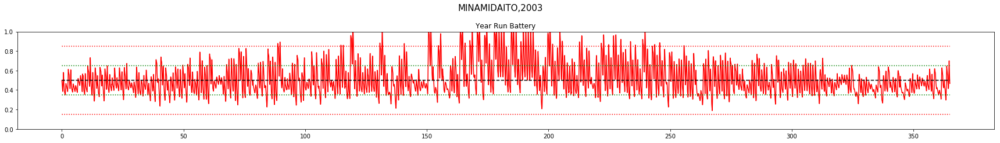



************************************
Day Violations           =     12
Battery Limit Violations =     31
Battery FULL Violations  =     31
Battery EMPTY Violations =      0


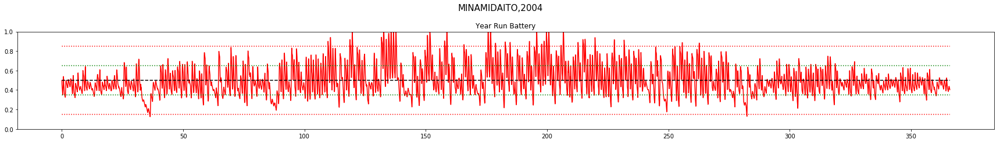



************************************
Day Violations           =      9
Battery Limit Violations =     59
Battery FULL Violations  =     18
Battery EMPTY Violations =     41


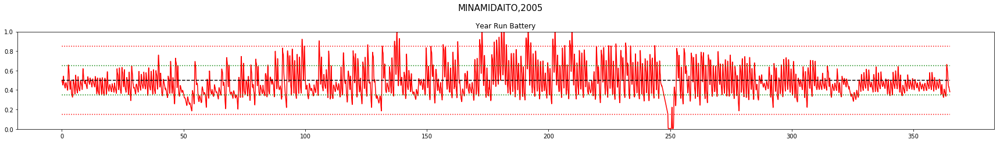



************************************
Day Violations           =     11
Battery Limit Violations =     28
Battery FULL Violations  =     28
Battery EMPTY Violations =      0


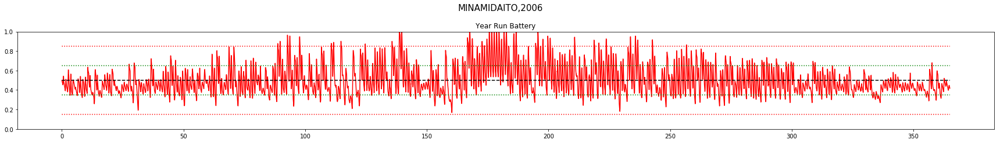



************************************
Day Violations           =     11
Battery Limit Violations =     31
Battery FULL Violations  =     31
Battery EMPTY Violations =      0


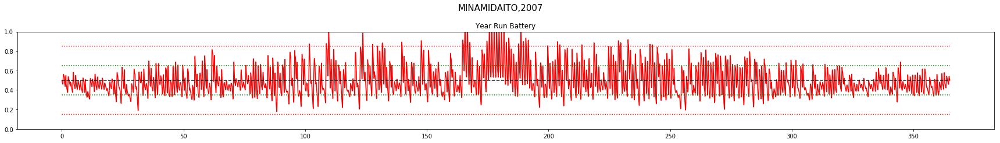



************************************
Day Violations           =      3
Battery Limit Violations =      8
Battery FULL Violations  =      8
Battery EMPTY Violations =      0


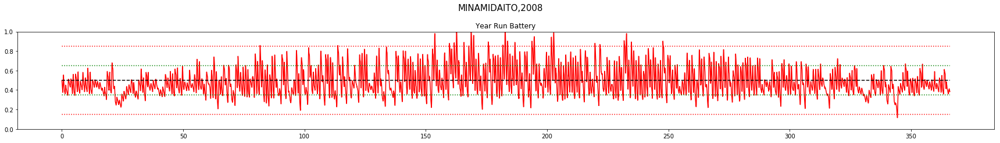



************************************
Day Violations           =      8
Battery Limit Violations =     21
Battery FULL Violations  =     21
Battery EMPTY Violations =      0


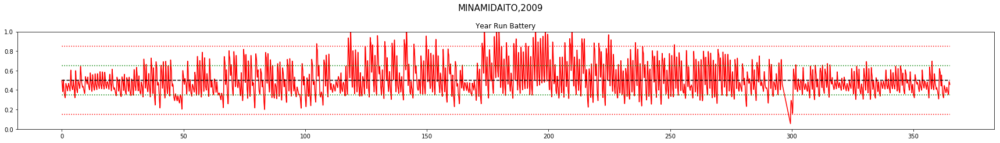



************************************
Day Violations           =     12
Battery Limit Violations =     38
Battery FULL Violations  =     38
Battery EMPTY Violations =      0


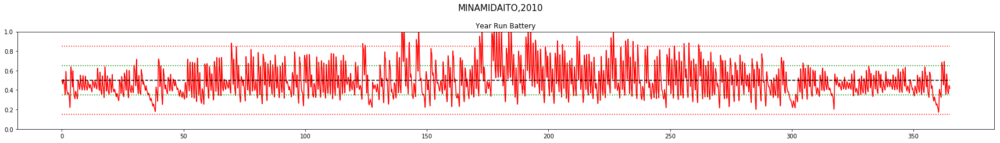



************************************
Day Violations           =      8
Battery Limit Violations =     25
Battery FULL Violations  =     25
Battery EMPTY Violations =      0


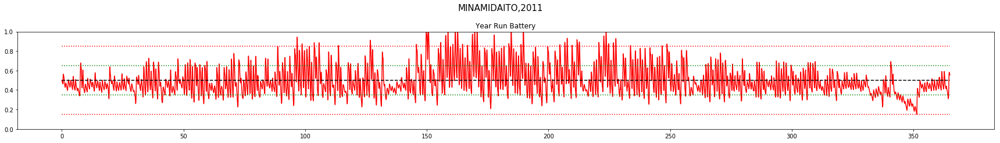



************************************
Day Violations           =     12
Battery Limit Violations =     98
Battery FULL Violations  =     23
Battery EMPTY Violations =     75


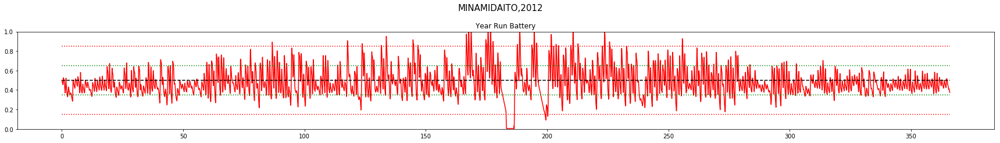



************************************
Day Violations           =     14
Battery Limit Violations =     37
Battery FULL Violations  =     37
Battery EMPTY Violations =      0


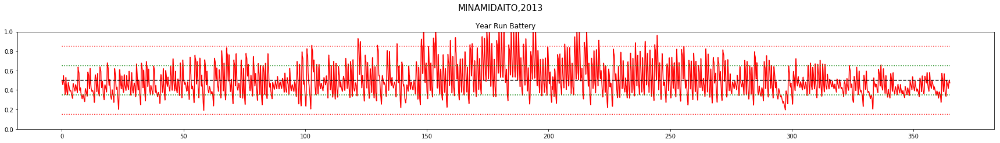



************************************
Day Violations           =     10
Battery Limit Violations =     27
Battery FULL Violations  =     27
Battery EMPTY Violations =      0


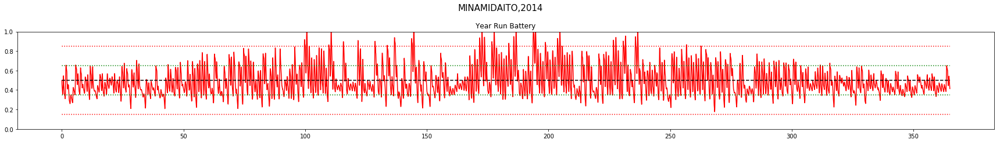



************************************
Day Violations           =     17
Battery Limit Violations =     54
Battery FULL Violations  =     54
Battery EMPTY Violations =      0


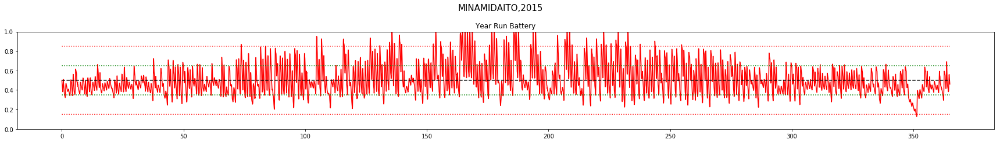



************************************
Day Violations           =     19
Battery Limit Violations =     54
Battery FULL Violations  =     54
Battery EMPTY Violations =      0


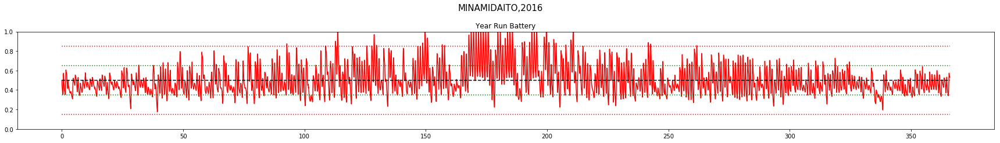



************************************
Day Violations           =     13
Battery Limit Violations =     34
Battery FULL Violations  =     34
Battery EMPTY Violations =      0


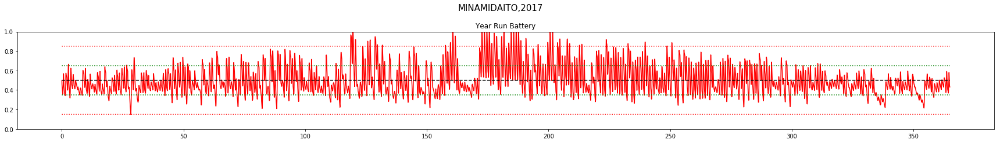



************************************
Day Violations           =     12
Battery Limit Violations =     37
Battery FULL Violations  =     37
Battery EMPTY Violations =      0


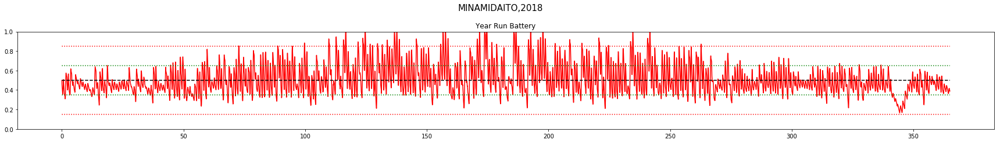



MINAMIDAITO
YEAR	AVG_RWD		VIOLATIONS	EMPTY	FULL
			DAY	BATT
2000	 0.97		9	 26	0	26
2001	 0.96		12	 35	0	35
2002	 0.96		8	 22	0	22
2003	 0.93		24	 75	0	75
2004	 0.95		12	 31	0	31
2005	 0.96		9	 59	41	18
2006	 0.96		11	 28	0	28
2007	 0.97		11	 31	0	31
2008	 0.97		3	 8	0	8
2009	 0.96		8	 21	0	21
2010	 0.95		12	 38	0	38
2011	 0.96		8	 25	0	25
2012	 0.95		12	 98	75	23
2013	 0.95		14	 37	0	37
2014	 0.97		10	 27	0	27
2015	 0.94		17	 54	0	54
2016	 0.95		19	 54	0	54
2017	 0.96		13	 34	0	34
2018	 0.95		12	 37	0	37

TOTAL Day  Violations:   224.0
TOTAL Batt  Violations:  740.0
TOTAL EMPTY Violations:  116.0
TOTAL FULL  Violations:  624.0
************************************


In [40]:
#VALIDATION PHASE
print("***MEASURING PERFORMANCE OF THE MODEL***")
for LOCATION in ['wakkanai','aomori','tokyo','fukuoka','minamidaito']:
    results = np.empty(6)
    for YEAR in np.arange(2000,2019):
        capm      = CAPM(LOCATION,YEAR,shuffle=False, trainmode=False) #instantiate the CAPM class
        capm.eno  = ENO(LOCATION,YEAR, shuffle=False, day_balance=False) #instantiate the environment inside the CAPM class
        capm.HMAX = capm.eno.SMAX #maximum power output of solar cell is set in CAPM object using the value in ENO object

        s, r, day_end, year_end = capm.reset()
        yr_test_record = np.empty(4)

        while True:
            a = dqn.choose_greedy_action(stdize(s))
            yr_test_record = np.vstack((yr_test_record, [s[0],s[2],r, a])) #record battery, henergy, reward and action
            s_, r, day_end, year_end = capm.step(a)
            if year_end:
                break
            s = s_

        yr_test_record = np.delete(yr_test_record, 0, 0) #remove the first row which is garbage
        yr_test_reward_rec = yr_test_record[:,2]
        yr_test_reward_rec = yr_test_reward_rec[::24] #annual average reward
        results = np.vstack((results, [int(YEAR), np.mean(yr_test_reward_rec), int(capm.violation_counter), int(capm.batt_violations), int(capm.batt_empty_counter), int(capm.batt_full_counter)]))
        print("\n\n************************************")
        print("Day Violations           = {:6d}".format(capm.violation_counter))
        print("Battery Limit Violations = {:6d}".format(capm.batt_violations))
        print("Battery FULL Violations  = {:6d}".format(capm.batt_full_counter))
        print("Battery EMPTY Violations = {:6d}".format(capm.batt_empty_counter))
    ###########################################################################################
    ###########################################################################################
        #     Plot the reward and battery for the entire year run
        title = LOCATION.upper() + ',' + str(YEAR)
        NO_OF_DAYS = capm.eno.NO_OF_DAYS

        fig = plt.figure(figsize=(24,6))
        fig.suptitle(title, fontsize=15)

    #         ax1 = fig.add_subplot(211)
    #         ax1.plot(yr_test_reward_rec)
    #         ax1.set_title("\n\nYear Run Reward")
    #         ax1.set_ylim([-4,2])

        ax2 = fig.add_subplot(211)
        ax2.plot(yr_test_record[:,0],'r')
        ax2.plot(np.ones_like(yr_test_record[:,0])*capm.BOPT/capm.BMAX, 'k--')
        ax2.plot(np.ones_like(yr_test_record[:,0])*capm.BLIM_LO/capm.BMAX, 'r:')
        ax2.plot(np.ones_like(yr_test_record[:,0])*capm.BLIM_HI/capm.BMAX, 'r:')
        ax2.plot(np.ones_like(yr_test_record[:,0])*(capm.BOPT+capm.ENP_MARGIN /2) /capm.BMAX, 'g:')
        ax2.plot(np.ones_like(yr_test_record[:,0])*(capm.BOPT-capm.ENP_MARGIN/2)/capm.BMAX, 'g:')

        ax2.set_title("\n\nYear Run Battery")
        ax2.set_ylim([0,1])
        plt.sca(ax2)
        plt.xticks(np.arange(0, NO_OF_DAYS*24, 50*24),np.arange(0,NO_OF_DAYS,50))
        fig.tight_layout()
        plt.show()
    ###########################################################################################
    ###########################################################################################


    results = np.delete(results,0,0)
    print("\n")
    print(LOCATION.upper())
    print('YEAR\tAVG_RWD\t\tVIOLATIONS\tEMPTY\tFULL')
    print('\t\t\tDAY\tBATT')

    for x in np.arange(0,results.shape[0]):
        print('{}\t {}\t\t{}\t {}\t{}\t{}'.format(int(results[x,0]), np.around(results[x,1],2), int(results[x,2]), int(results[x,3]), int(results[x,4]),  int(results[x,5]) ))

    print("\nTOTAL Day  Violations:  ",np.sum(results[:, 2]))
    print("TOTAL Batt  Violations: ",np.sum(results[:,3]))
    print("TOTAL EMPTY Violations: ",np.sum(results[:,4]))
    print("TOTAL FULL  Violations: ",np.sum(results[:,5]))
    print("************************************")